In [465]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cmaps
from matplotlib.colors import LogNorm
from matplotlib.colors import ListedColormap
import matplotlib.colors as colors
import cartopy.feature as cfea

In [431]:
def geography():
    SUF = '.gl5'
    dtype = 'float32'
    #
    a = 2160
    b = 4320
    gl5shape = (a, b)
    #
    city_num = 1
    #
    # region
    one = 138
    two = 141
    three = 34
    four = 37
    #
    upperindex = (90-four)*12
    lowerindex = (90-three)*12
    leftindex = (180+one)*12
    rightindex = (180+two)*12
    #
    rgnshape = (lowerindex-upperindex, rightindex-leftindex)
    #
    img_extent = (one, two, three, four)
    
    return a, b, upperindex, lowerindex, leftindex, rightindex, rgnshape, img_extent, city_num

In [445]:
def geography():
    SUF = '.gl5'
    dtype = 'float32'
    #
    a = 2160
    b = 4320
    gl5shape = (a, b)
    #
    city_num = 29
    #
    # region
    one = -3
    two = 1
    three = 50
    four = 53
    #
    upperindex = (90-four)*12
    lowerindex = (90-three)*12
    leftindex = (180+one)*12
    rightindex = (180+two)*12
    #
    rgnshape = (lowerindex-upperindex, rightindex-leftindex)
    #
    img_extent = (one, two, three, four)
    
    return a, b, upperindex, lowerindex, leftindex, rightindex, rgnshape, img_extent, city_num

In [450]:
def geography():
    SUF = '.gl5'
    dtype = 'float32'
    #
    a = 2160
    b = 4320
    gl5shape = (a, b)
    #
    city_num = 20
    #
    # region
    one = 0
    two = 6
    three = 46
    four = 52
    #
    upperindex = (90-four)*12
    lowerindex = (90-three)*12
    leftindex = (180+one)*12
    rightindex = (180+two)*12
    #
    rgnshape = (lowerindex-upperindex, rightindex-leftindex)
    #
    img_extent = (one, two, three, four)
    
    return a, b, upperindex, lowerindex, leftindex, rightindex, rgnshape, img_extent, city_num

In [ ]:
def geography():
    SUF = '.gl5'
    dtype = 'float32'
    #
    a = 2160
    b = 4320
    gl5shape = (a, b)
    #
    city_num = 12
    #
    # region
    one = -120
    two = -116
    three = 32
    four = 36
    #
    upperindex = (90-four)*12
    lowerindex = (90-three)*12
    leftindex = (180+one)*12
    rightindex = (180+two)*12
    #
    rgnshape = (lowerindex-upperindex, rightindex-leftindex)
    #
    img_extent = (one, two, three, four)
    
    return a, b, upperindex, lowerindex, leftindex, rightindex, rgnshape, img_extent, city_num

In [471]:
def geography():
    SUF = '.gl5'
    dtype = 'float32'
    #
    a = 2160
    b = 4320
    gl5shape = (a, b)
    #
    city_num = 2
    #
    # region
    one = 134
    two = 137
    three = 33
    four = 36
    #
    upperindex = (90-four)*12
    lowerindex = (90-three)*12
    leftindex = (180+one)*12
    rightindex = (180+two)*12
    #
    rgnshape = (lowerindex-upperindex, rightindex-leftindex)
    #
    img_extent = (one, two, three, four)
    
    return a, b, upperindex, lowerindex, leftindex, rightindex, rgnshape, img_extent, city_num

In [481]:
def geography():
    SUF = '.gl5'
    dtype = 'float32'
    #
    a = 2160
    b = 4320
    gl5shape = (a, b)
    #
    city_num = 22
    #
    # region
    one = 136
    two = 138
    three = 34
    four = 37
    #
    upperindex = (90-four)*12
    lowerindex = (90-three)*12
    leftindex = (180+one)*12
    rightindex = (180+two)*12
    #
    rgnshape = (lowerindex-upperindex, rightindex-leftindex)
    #
    img_extent = (one, two, three, four)
    
    return a, b, upperindex, lowerindex, leftindex, rightindex, rgnshape, img_extent, city_num

In [482]:
def lonlat2xy(loncnt, latcnt):
    a, b, upperindex, lowerindex, leftindex, rightindex, rgnshape, img_extent, city_num = geography()
    
    if -180 <= loncnt <=180:
        lon_middle = int(((loncnt+180)/360)*b )
        lat_middle = int(((90-latcnt)/180)*a ) 
    else:
        lon_middle = 1e20
        lat_middle = 1e20
    
    return lon_middle, lat_middle

In [483]:
def draw_mask(mask_temp, pop_temp, city_index, loop_num, maximum_value):
    # get city lonlat
    a, b, upperindex, lowerindex, leftindex, rightindex, rgnshape, img_extent, city_num = geography()

    # crop
    mask_cropped = mask_temp[upperindex:lowerindex, leftindex:rightindex]
    
    # pop
    pop_cropped = pop_temp[upperindex:lowerindex, leftindex:rightindex]
    
    # josui
    josui_path = f"/home/kajiyama/H08/takahashi/jyousui_20240109.csv"
    josui = pd.read_csv(josui_path)
    
    # regionalize
    josui_array = np.zeros((a, b))
    # 
    for i in range(len(josui['lon'])):
        lon_middle, lat_middle = lonlat2xy(josui['lon'][i], josui['lat'][i])
        # missing value in csv
        if lon_middle >= b or lat_middle >= a:
            continue
        else:
            josui_array[lat_middle, lon_middle] = 1
    #        
    josui_cropped = josui_array[upperindex:lowerindex, leftindex:rightindex]
    josui_masked = np.ma.masked_where(josui_cropped==0, josui_cropped)

    # extent
    projection = ccrs.PlateCarree()

    # figure
    fig = plt.figure(figsize=(10,10))
    ax = plt.subplot(projection=projection)
    ax.coastlines()
    ax.set_extent(img_extent)
    ax.gridlines(draw_labels=True)
    im = ax.imshow(pop_cropped,
                   origin='upper',extent=img_extent, transform=projection, cmap='gist_heat_r',
                  )
    #
    seethrough = np.ma.masked_where(mask_cropped == 0, mask_cropped)
    seethrough[-1, -1] = 0
    im2 = ax.imshow(seethrough,
                    origin='upper',extent=img_extent, transform=projection, cmap='gray_r'
                   )
    # 
    josui_cmap = plt.cm.colors.ListedColormap(['white', 'blue'])
    im3 = ax.imshow(josui_masked, 
                    origin='upper', cmap=josui_cmap, vmin=0, vmax=1, extent=img_extent,  transform=projection, zorder=3)
    im4 = ax.scatter(josui['lon'], josui['lat'], color='green', s=5, zorder=4)
    
    # save figure
    gif_path = f'./gifs/{loop_num:08}.jpg'
    plt.title(f"maximum population density {maximum_value} / km2")
    #plt.savefig(gif_path)
    plt.show()

In [484]:
def explore_citymask(index):

    #-----------------------------------------------
    # Initialization
    #-----------------------------------------------

    # map data
    MAP='CAMA'

    # explore grid radius
    radius_max = 12

    # search radius (1grid in 0.5degree)
    circle = 3

    # lower limitation of population density
    # if lowlim>=1e-9, tokyo mask looks like doi & kato's result
    lowlim = 1

    # initial grid threshold
    threshold = 100

    # shape
    lat_shape = 2160
    lon_shape = 4320

    # date type
    dtype= 'float32'

    # h08 directory
    h08dir = '/home/kajiyama/H08/H08_20230612'

    # initialize variables
    best_coverage = float('inf')
    best_mask = None
    best_masked_pop = None

    #-----------------------------------------------
    # load true data (UN city list) unit=[1000person]
    #-----------------------------------------------

    # true population and city name
    un_pop_list = []
    name_list = []

    # load data
    city_path = h08dir + '/map/dat/cty_lst_/city_list03.txt'
    for l in open(city_path).readlines():
        data = l[:-1].split('	')
        un_pop_list.append(int(data[4]))
        name_list.append(data[5])

    # get true UN city population
    un_pop = un_pop_list[index-1]*1000

    # get city name
    city_name = name_list[index-1]

    #-----------------------------------------------
    #  Get area(m2)
    #-----------------------------------------------

    area_path = f'{h08dir}/map/dat/lnd_ara_/lndara.{MAP}.gl5'
    area = np.fromfile(area_path, dtype=dtype).reshape(lat_shape, lon_shape)

    #-----------------------------------------------
    # load gwp population data
    #-----------------------------------------------

    # population data(GWP4 2000)
    pop_path = f'{h08dir}/map/dat/pop_tot_/C05_a___20000000.gl5'
    gwp_pop = np.fromfile(pop_path, dtype=dtype).reshape(lat_shape, lon_shape)

    # population density (person/km2)
    gwp_pop_density = (gwp_pop / (area / 10**6))

    #-----------------------------------------------
    # load city_center coordinate
    #-----------------------------------------------

    center_path = f'{h08dir}/map/dat/cty_cnt_/modified/city_{index:08d}.gl5'
    location = np.fromfile(center_path, dtype=dtype).reshape(lat_shape,lon_shape)
    x = np.where(location==1)[0]
    y = np.where(location==1)[1]
    x = x[0]
    y = y[0]

    #-----------------------------------------------
    #  Initialization of mask array
    #-----------------------------------------------

    # mask array for saving
    mask = np.zeros((lat_shape,lon_shape), dtype=dtype)
    mask[x, y] = 1

    #-----------------------------------------------
    #  Explore start
    #-----------------------------------------------

    # stop flag
    new_mask_added = True
    coverage_flag = True

    # city center
    best_mask = mask
    grid_num = np.sum(best_mask)
    best_masked_pop = np.sum(gwp_pop*mask)
    best_coverage = float(best_masked_pop / un_pop)

    # initial grid threshold
    if gwp_pop_density[x, y] <= threshold:
        print("/// stop ///")
        print("/// stop ///")
        print("/// stop ///")
        print("/// stop ///")
        print(f"initial density {gwp_pop_density[x, y]} less than threshold {threshold}")
        print("/// stop ///")
        print("/// stop ///")
        print("/// stop ///")
        print("/// stop ///")
        new_maske_added = False
        coverage_flag = False

    # loop start
    loop_num = 0
    while new_mask_added:

        ### make search list
        search_lst = []
        new_mask_added = False
        for a in range(max(0, x - radius_max), min(x + radius_max + 1, lat_shape)):
            for b in range(max(0, y - radius_max), min(y + radius_max + 1, lon_shape)):
                if mask[a, b] == 1:
                    # explore surrounded 8 grids
                    for dx, dy in [(-1, 0), (-1, 1), (0, 1), (1, 1), (1, 0), (1, -1), (0, -1), (-1, 1)]:
                        i, j = a + dx, b + dy
                        # not explored yet
                        if mask[i, j] == 0:
                            # within grid range
                            if 0 <= i < lat_shape and 0<= j < lon_shape:
                                search_lst.append([gwp_pop_density[i, j], i, j])

        ### add searched grid
        # empty check
        if not search_lst:
            new_mask_added = False
            coverage_flag = False
        # get largest grid
        else:
            
            sorted_search = sorted(search_lst, key=lambda x: x[0], reverse=True)
            largest = sorted_search[0]
            # if largest grid value is too small, stop exploring
            if gwp_pop_density[largest[1], largest[2]] <= lowlim:
                print("/// stop ///")
                print("/// stop ///")
                print("/// stop ///")
                print("/// stop ///")
                print(f"largest density {gwp_pop_density[largest[1], largest[2]]} smaller than lowlim {lowlim}")
                print([gwp_pop_density[t[1], t[2]]for t in sorted_search])
                print("/// stop ///")
                print("/// stop ///")
                print("/// stop ///")
                print("/// stop ///")
                new_mask_added = False
                coverage_flag = False
                
        # stop flag
        if coverage_flag is True:
                new_mask_added = True

                # evaluate coverage
                gwp_masked_pop = np.sum(mask * gwp_pop)
                coverage = float(gwp_masked_pop / un_pop)

                # stop exploring
                if coverage >= 1.0:
                    new_mask_added = False
                    coverage_flag = False

                # judge
                judge_value = abs(1 - coverage)
                best_value = abs(1 - best_coverage)
                
                # update
                if judge_value < best_value:
                    best_coverage = coverage
                    best_mask = mask
                    best_masked_pop = gwp_masked_pop
                    grid_num = np.sum(best_mask)
        
        # search_lst is colored
        for cand in search_lst:
            mask[cand[1], cand[2]] = 0.1
        # for drawing
        mask[largest[1], largest[2]] = 0.3
        
        # draw
        # cand = 0.3
        # largest = 0.6
        # citymask = 1
        maximum_value = np.round(gwp_pop_density[largest[1], largest[2]])
        draw_mask(best_mask, gwp_pop_density, index, loop_num, maximum_value)
        #new_mask_added = False # this should be removed in the future
        #coverage_flag = False # this should be removed in the future
        
        # reset
        mask[mask == 0.1] = 0
        mask[mask == 0.3] = 1
        # loop count
        loop_num += 1

        #-----------------------------------------------
        # Output result
        #-----------------------------------------------

        print('#########################################')
        print(
              f"explored_pop {best_masked_pop}\n" \
              f"true_pop {un_pop}\n" \
              f"coverage {best_coverage}\n" \
              f"city_mask {grid_num}\n" \
              f"{city_name}"
              )
        print('#########################################')

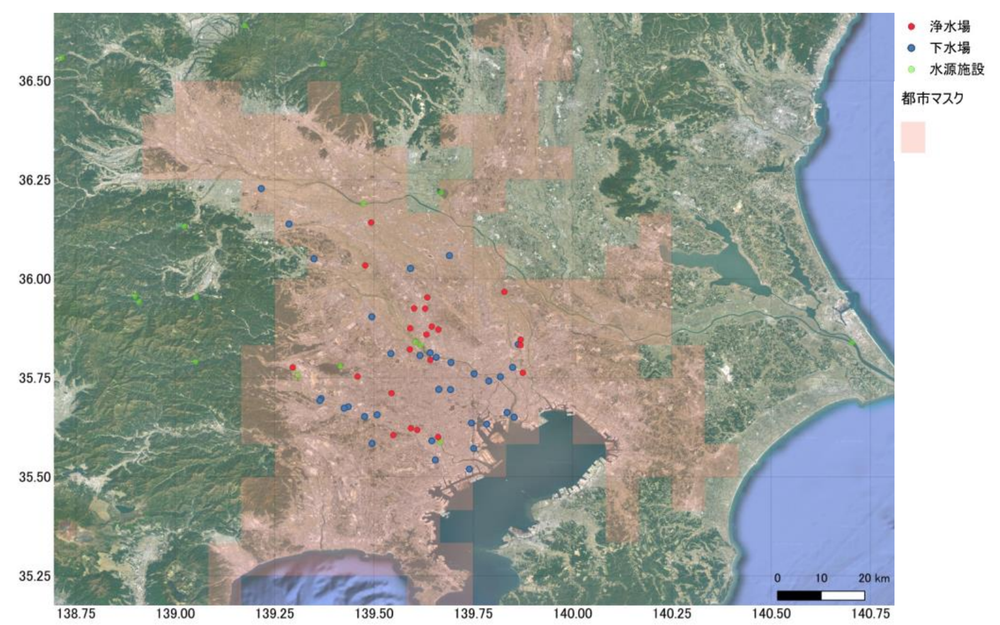

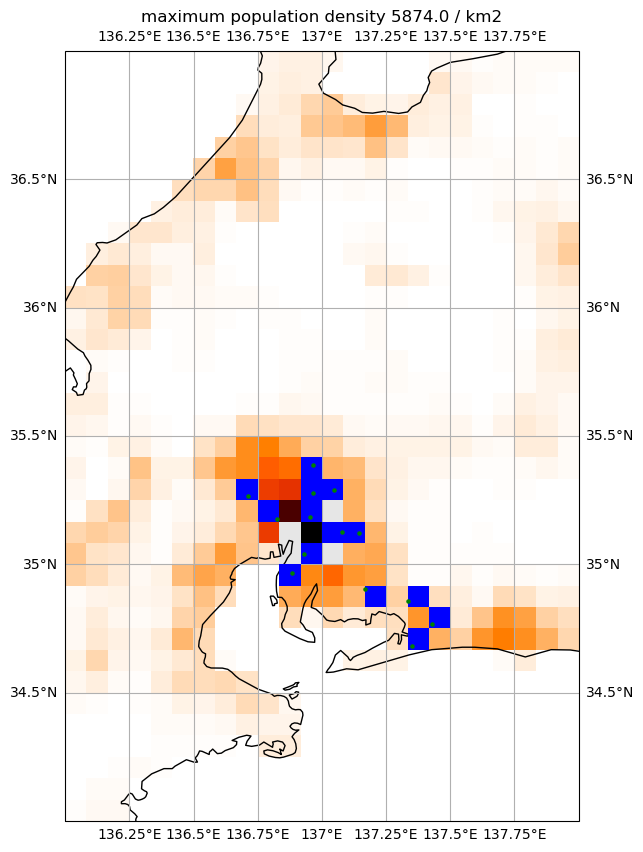

#########################################
explored_pop 550248.8125
true_pop 8740000
coverage 0.06295753003432494
city_mask 1.0
ChukyoM.M.A.(Nagoya)
#########################################


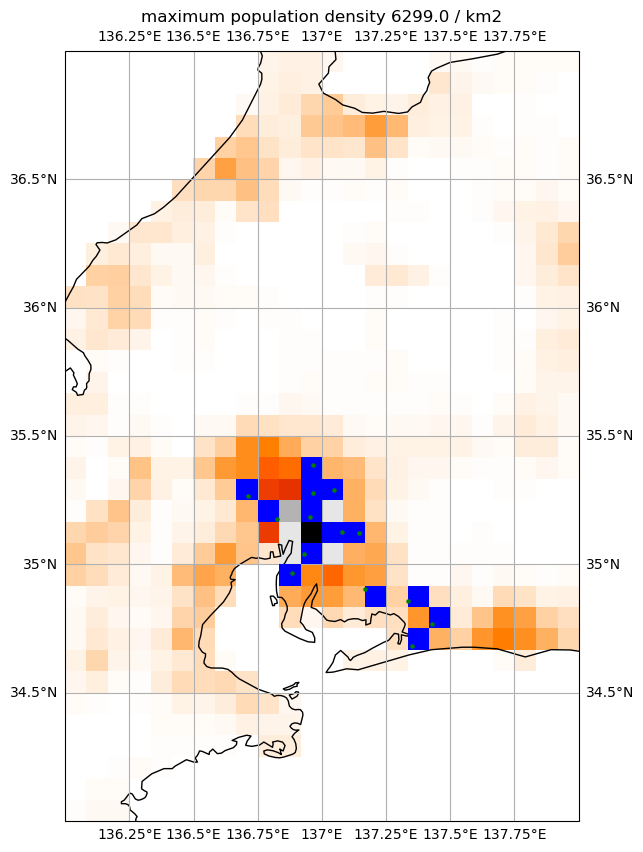

#########################################
explored_pop 961848.1875
true_pop 8740000
coverage 0.11005128003432495
city_mask 2.0
ChukyoM.M.A.(Nagoya)
#########################################


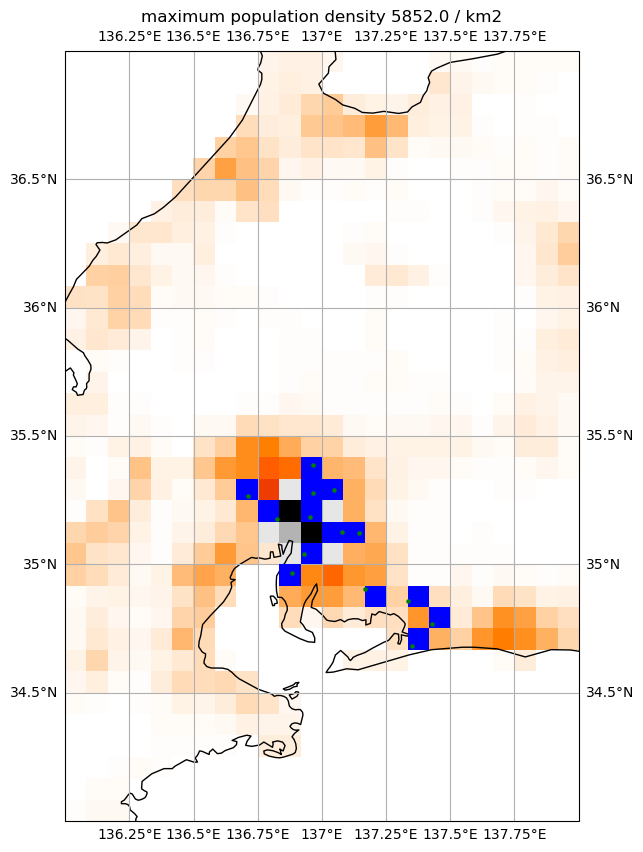

#########################################
explored_pop 1403232.25
true_pop 8740000
coverage 0.1605528890160183
city_mask 3.0
ChukyoM.M.A.(Nagoya)
#########################################


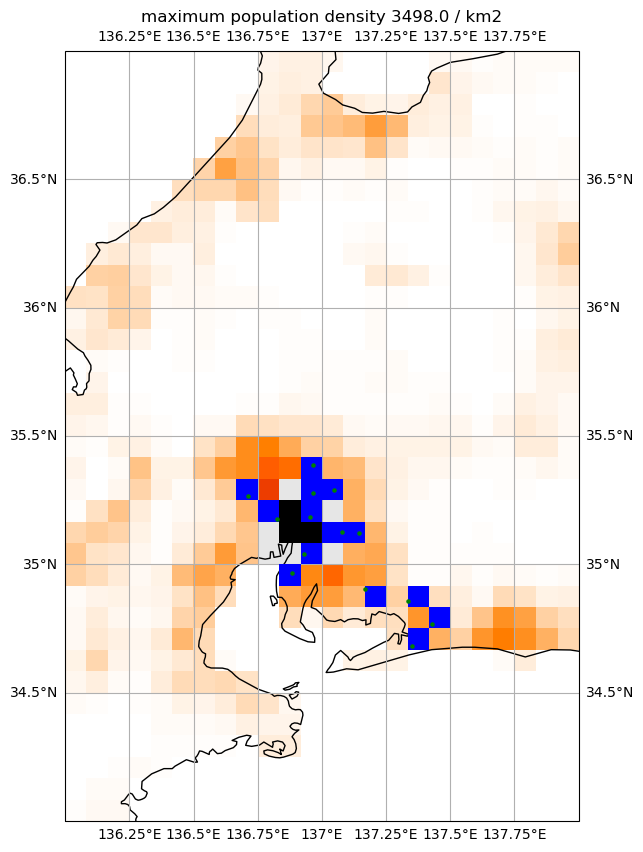

#########################################
explored_pop 1813768.25
true_pop 8740000
coverage 0.207524971395881
city_mask 4.0
ChukyoM.M.A.(Nagoya)
#########################################


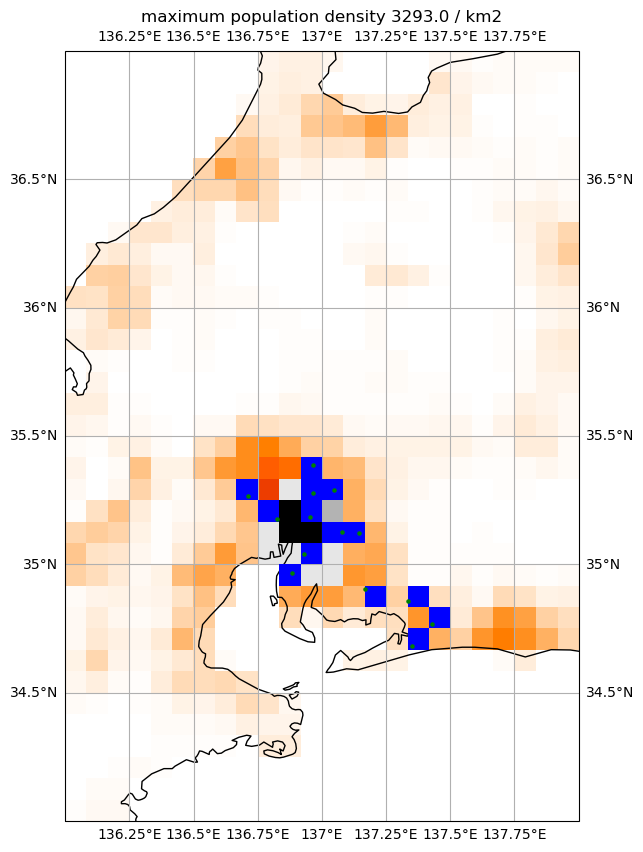

#########################################
explored_pop 2059365.5
true_pop 8740000
coverage 0.2356253432494279
city_mask 5.0
ChukyoM.M.A.(Nagoya)
#########################################


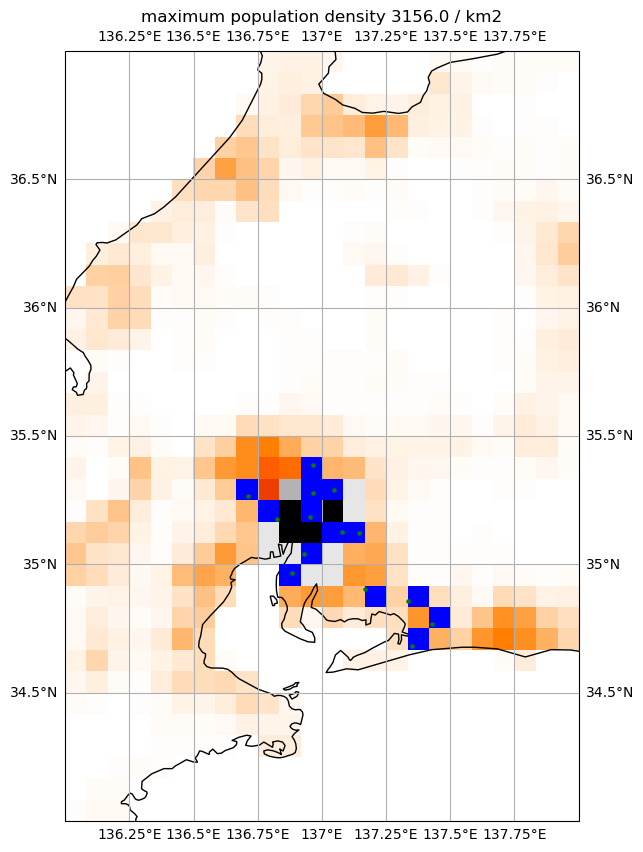

#########################################
explored_pop 2290102.75
true_pop 8740000
coverage 0.26202548627002287
city_mask 6.0
ChukyoM.M.A.(Nagoya)
#########################################


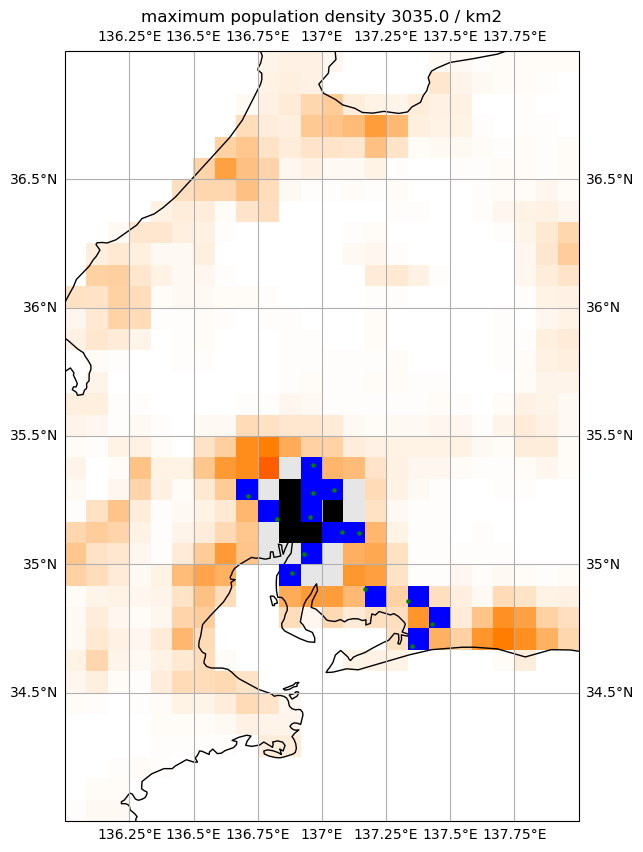

#########################################
explored_pop 2511025.5
true_pop 8740000
coverage 0.28730268878718535
city_mask 7.0
ChukyoM.M.A.(Nagoya)
#########################################


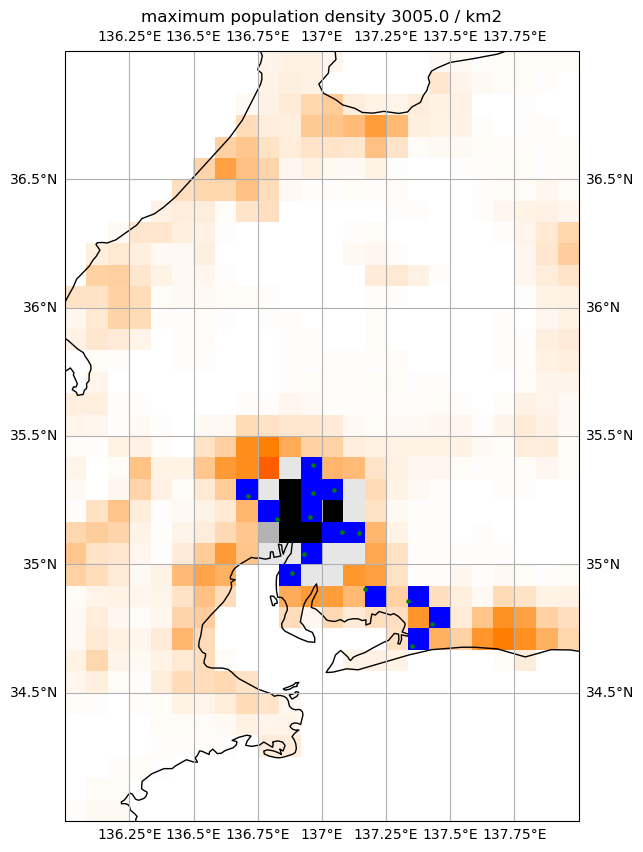

#########################################
explored_pop 2723946.5
true_pop 8740000
coverage 0.31166435926773456
city_mask 8.0
ChukyoM.M.A.(Nagoya)
#########################################


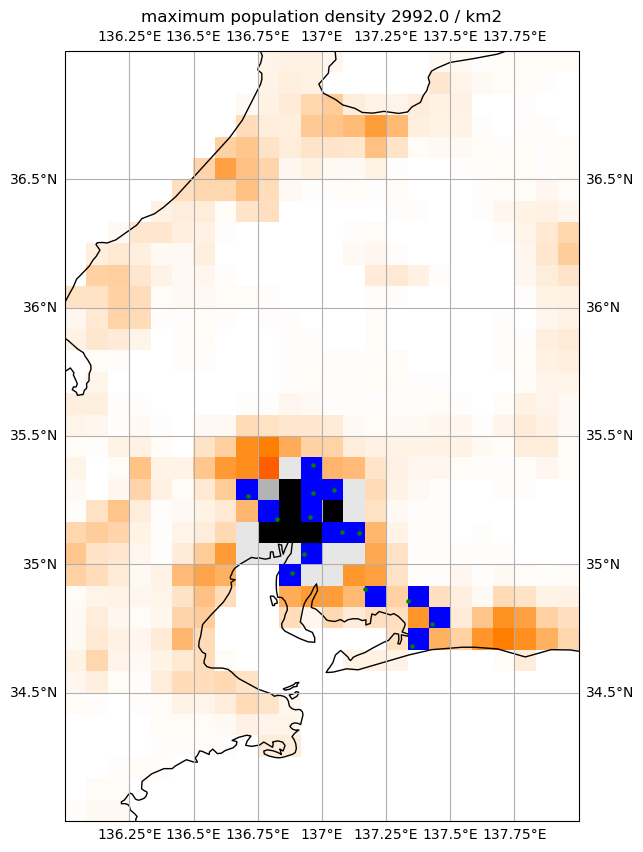

#########################################
explored_pop 2934778.5
true_pop 8740000
coverage 0.3357870137299771
city_mask 9.0
ChukyoM.M.A.(Nagoya)
#########################################


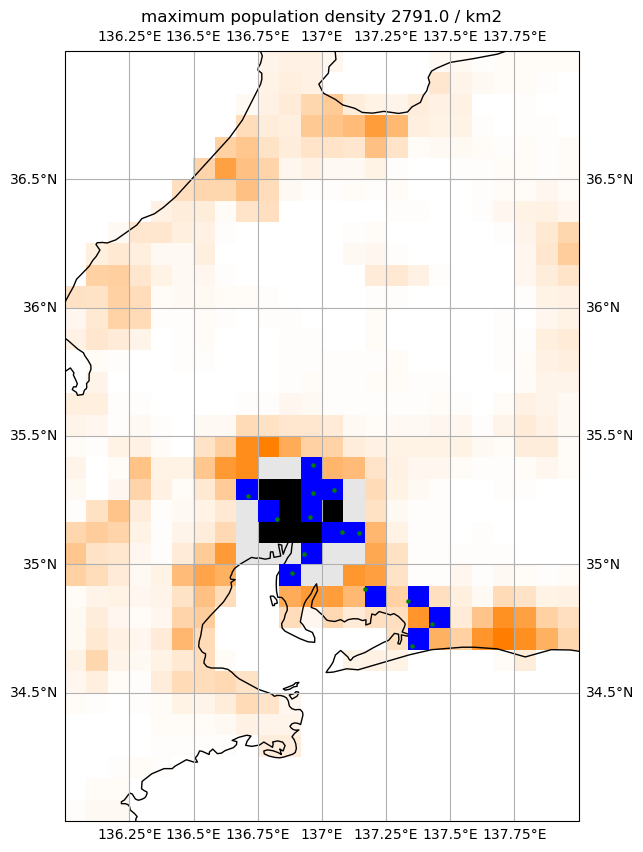

#########################################
explored_pop 3144247.5
true_pop 8740000
coverage 0.3597537185354691
city_mask 10.0
ChukyoM.M.A.(Nagoya)
#########################################


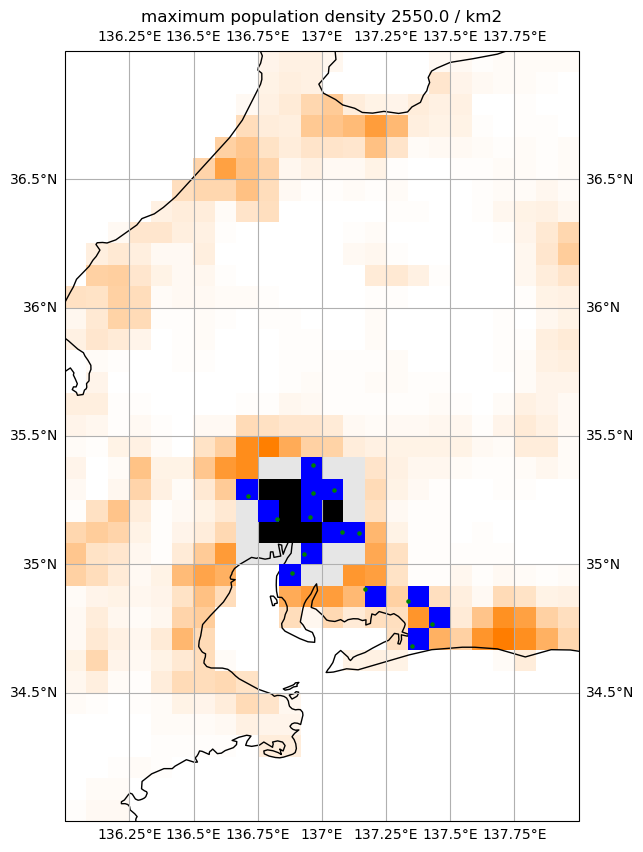

#########################################
explored_pop 3339636.5
true_pop 8740000
coverage 0.3821094393592677
city_mask 11.0
ChukyoM.M.A.(Nagoya)
#########################################


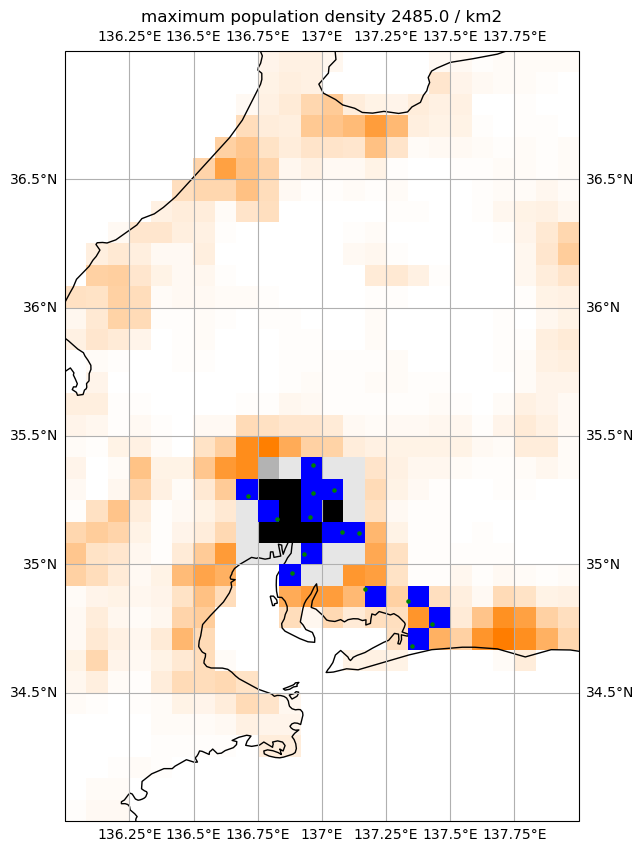

#########################################
explored_pop 3518335.5
true_pop 8740000
coverage 0.40255554919908465
city_mask 12.0
ChukyoM.M.A.(Nagoya)
#########################################


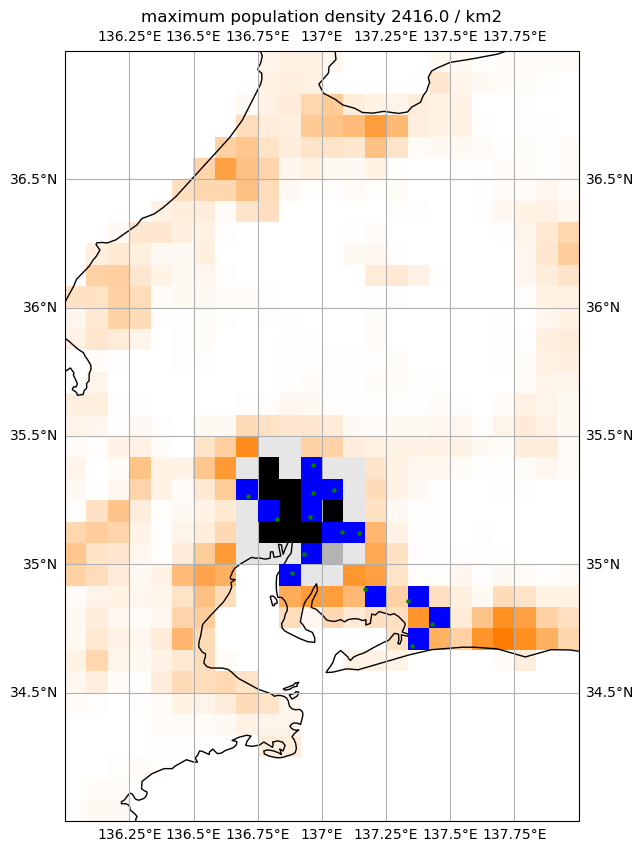

#########################################
explored_pop 3692089.5
true_pop 8740000
coverage 0.4224358695652174
city_mask 13.0
ChukyoM.M.A.(Nagoya)
#########################################


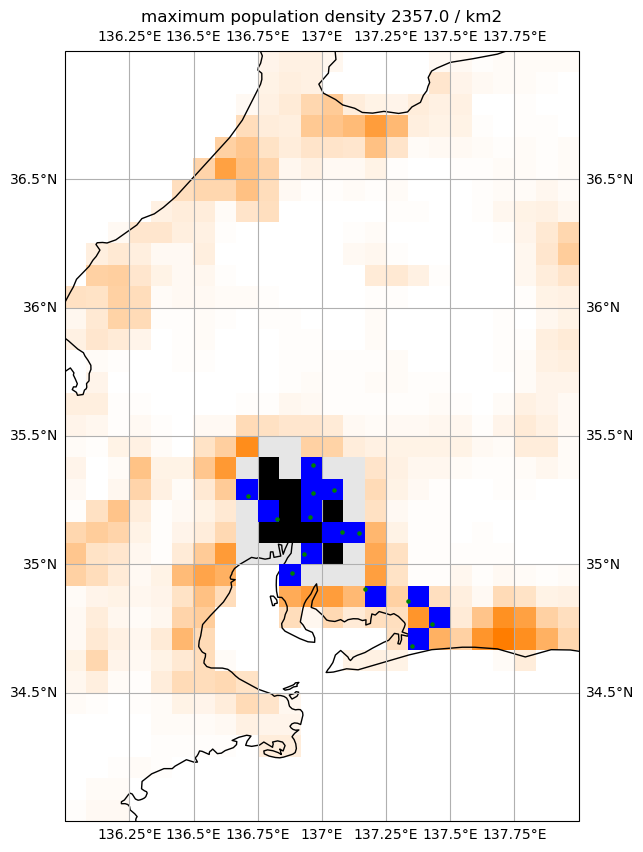

#########################################
explored_pop 3861717.0
true_pop 8740000
coverage 0.4418440503432494
city_mask 14.0
ChukyoM.M.A.(Nagoya)
#########################################


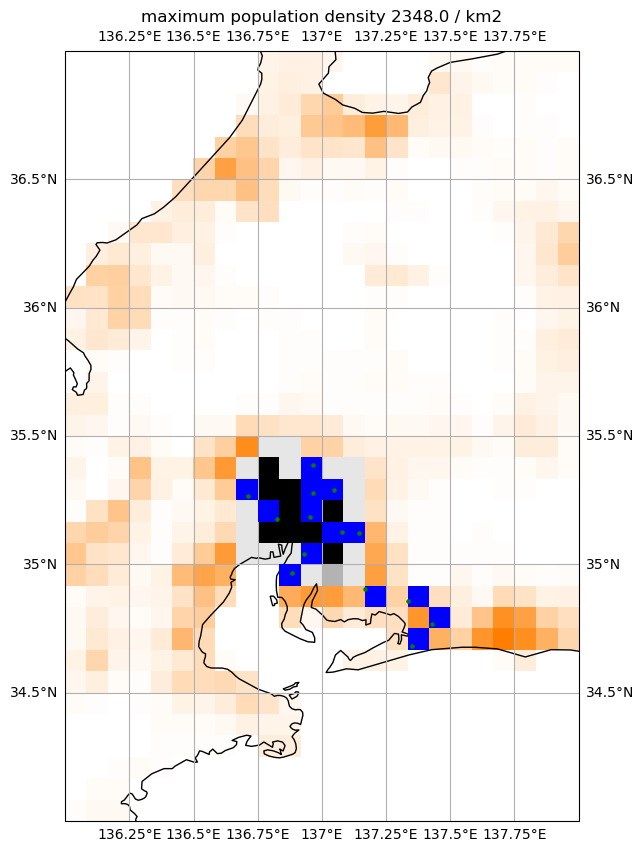

#########################################
explored_pop 4026743.0
true_pop 8740000
coverage 0.46072574370709385
city_mask 15.0
ChukyoM.M.A.(Nagoya)
#########################################


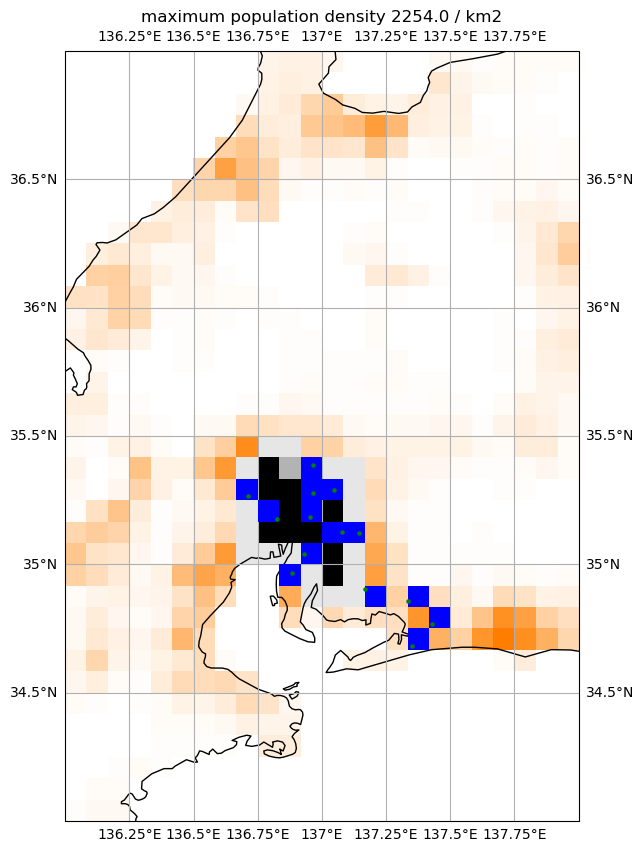

#########################################
explored_pop 4191797.75
true_pop 8740000
coverage 0.47961072654462245
city_mask 16.0
ChukyoM.M.A.(Nagoya)
#########################################


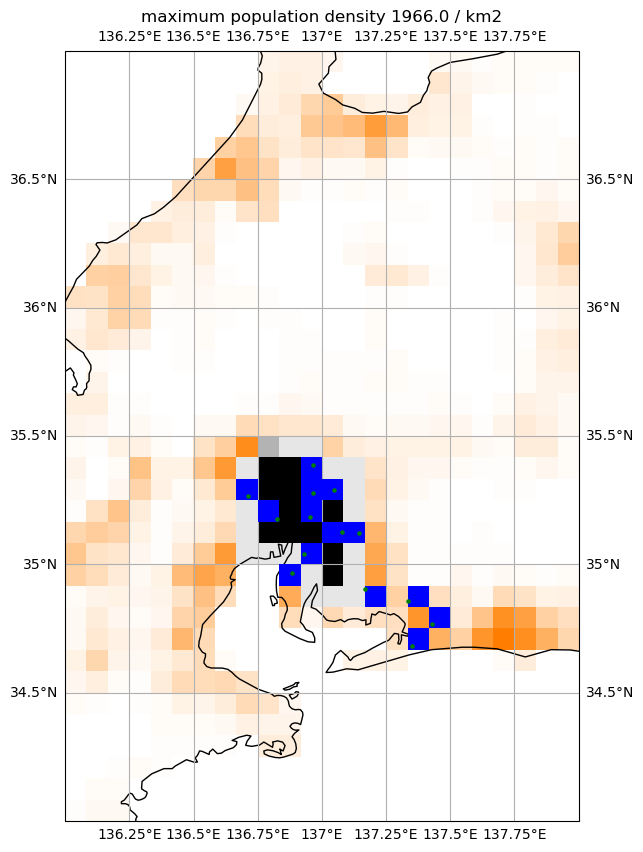

#########################################
explored_pop 4349402.0
true_pop 8740000
coverage 0.4976432494279176
city_mask 17.0
ChukyoM.M.A.(Nagoya)
#########################################


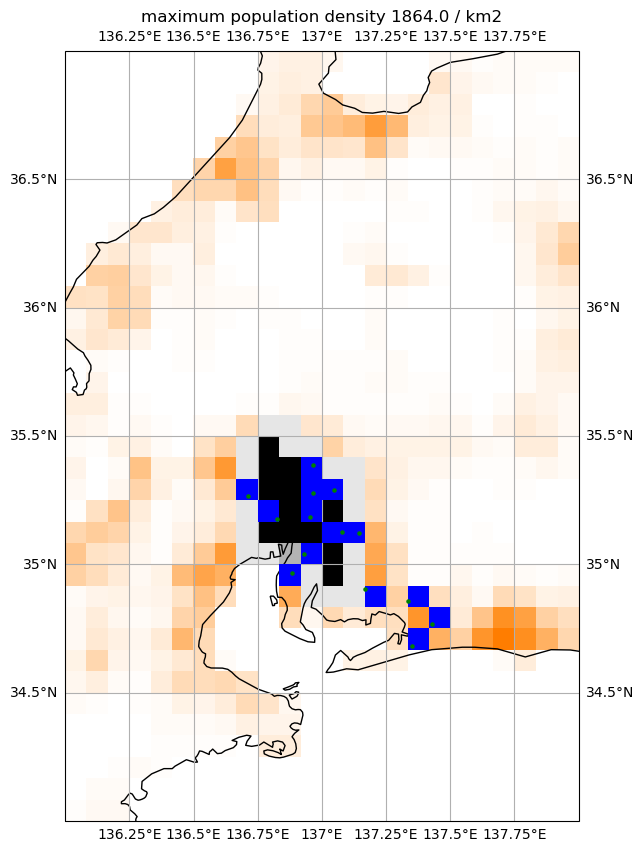

#########################################
explored_pop 4486729.5
true_pop 8740000
coverage 0.5133557780320366
city_mask 18.0
ChukyoM.M.A.(Nagoya)
#########################################


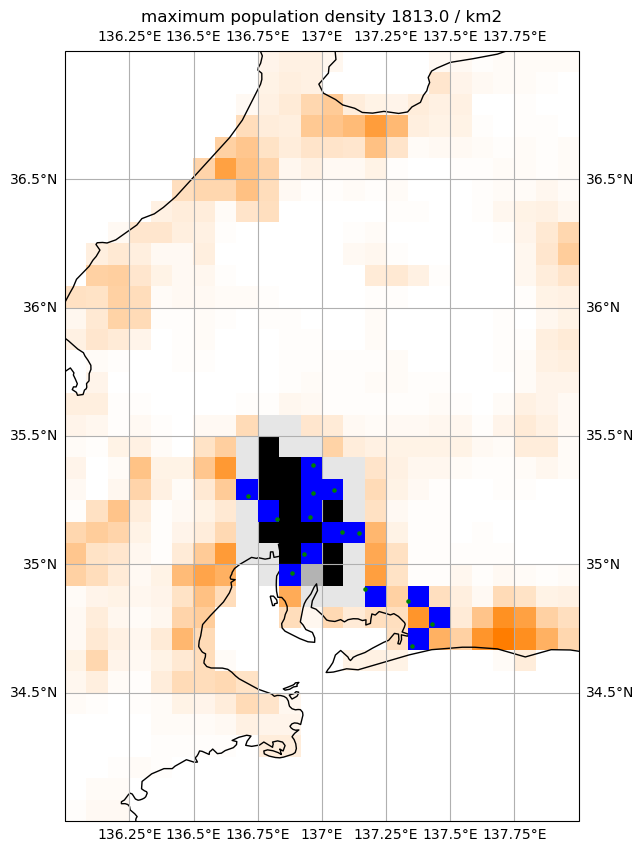

#########################################
explored_pop 4617651.0
true_pop 8740000
coverage 0.5283353546910755
city_mask 19.0
ChukyoM.M.A.(Nagoya)
#########################################


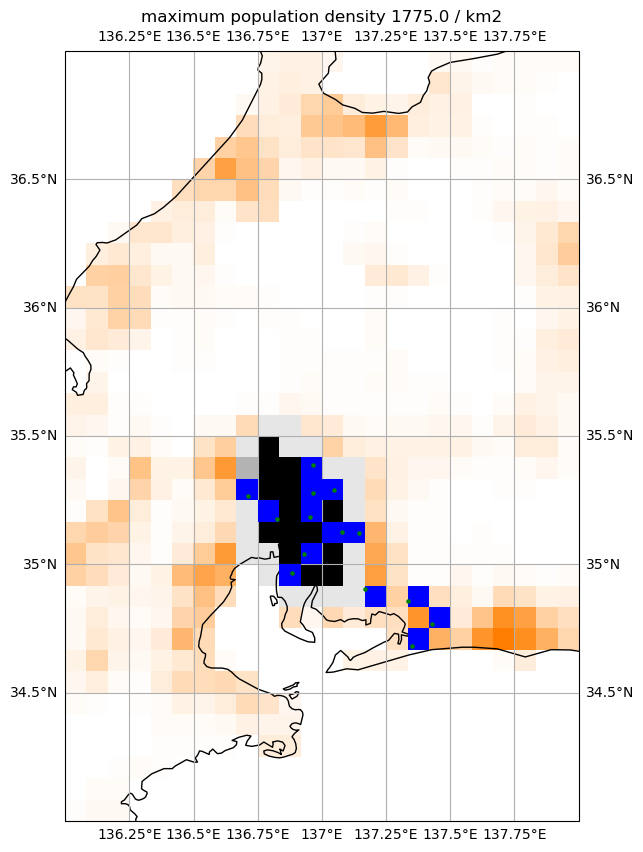

#########################################
explored_pop 4745101.5
true_pop 8740000
coverage 0.5429177917620137
city_mask 20.0
ChukyoM.M.A.(Nagoya)
#########################################


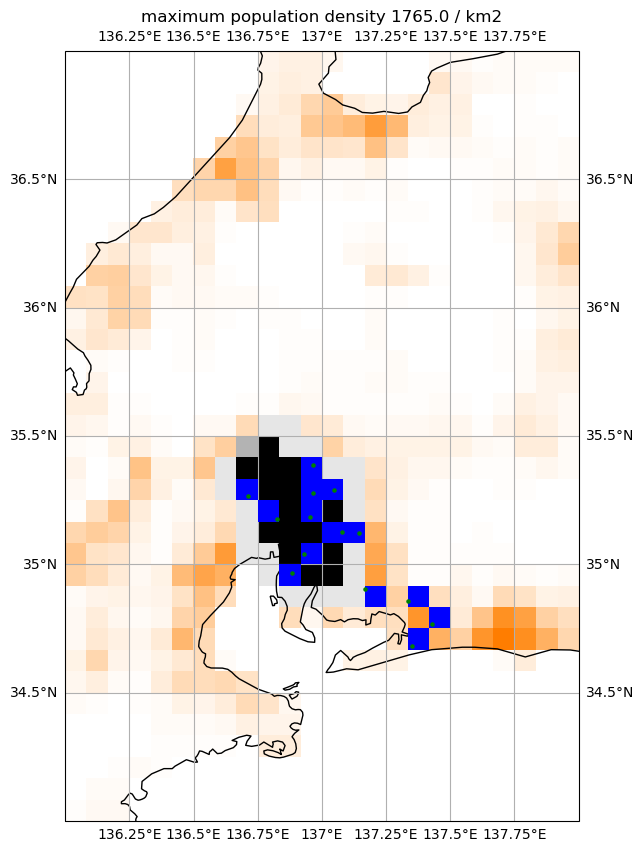

#########################################
explored_pop 4869257.0
true_pop 8740000
coverage 0.5571232265446224
city_mask 21.0
ChukyoM.M.A.(Nagoya)
#########################################


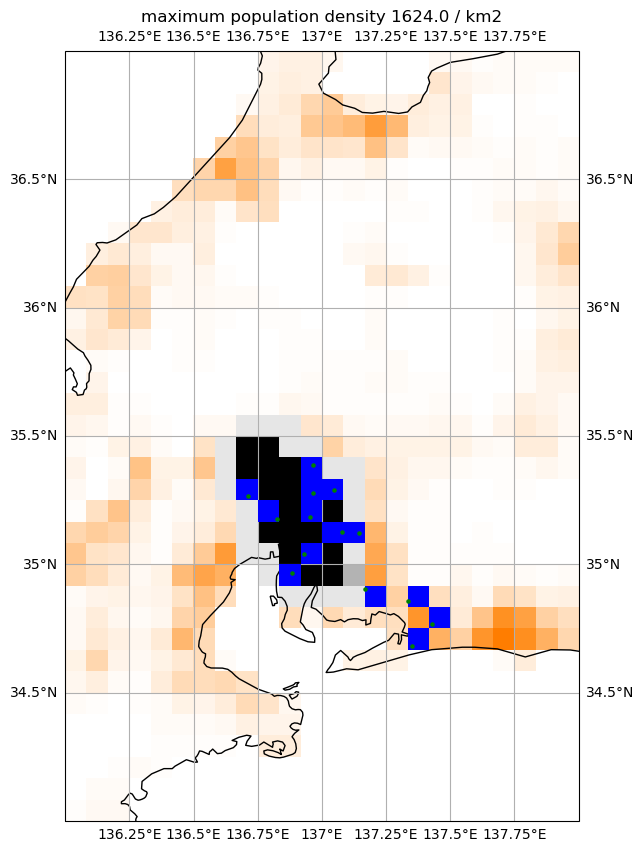

#########################################
explored_pop 4992542.5
true_pop 8740000
coverage 0.571229118993135
city_mask 22.0
ChukyoM.M.A.(Nagoya)
#########################################


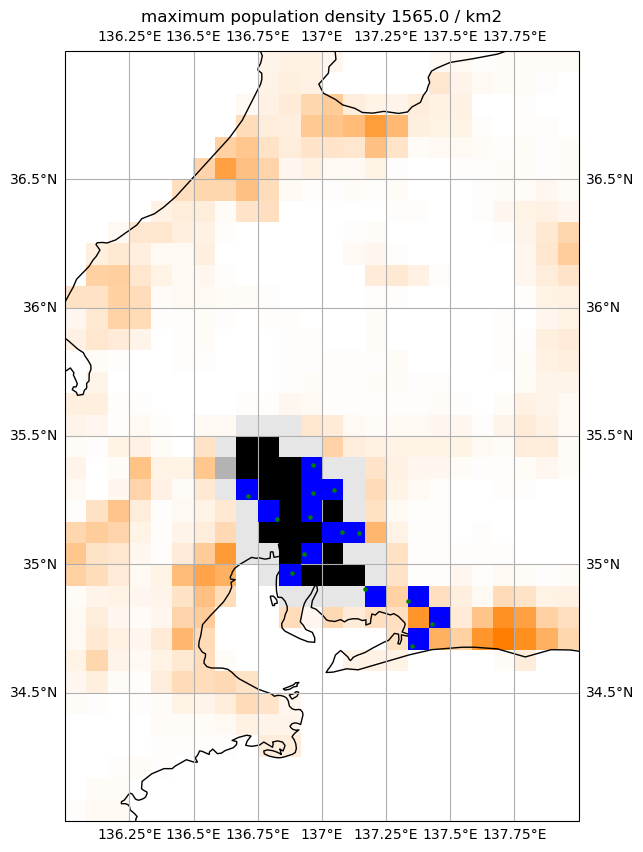

#########################################
explored_pop 5106681.0
true_pop 8740000
coverage 0.5842884439359268
city_mask 23.0
ChukyoM.M.A.(Nagoya)
#########################################


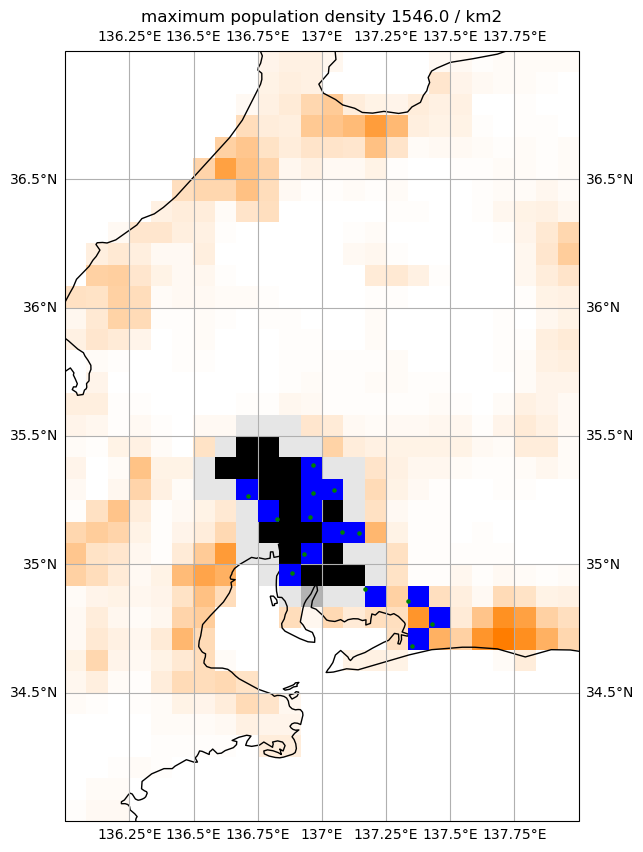

#########################################
explored_pop 5216111.0
true_pop 8740000
coverage 0.5968090389016019
city_mask 24.0
ChukyoM.M.A.(Nagoya)
#########################################


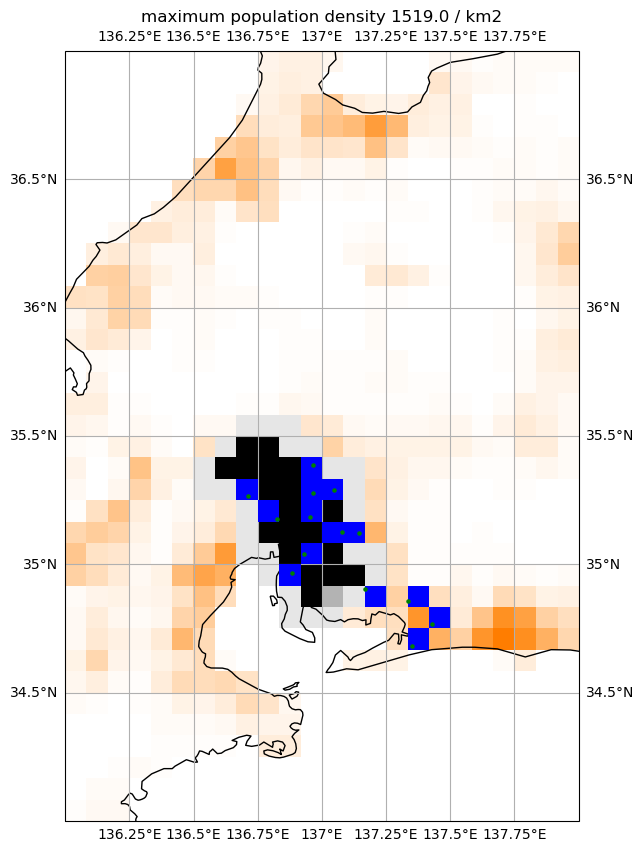

#########################################
explored_pop 5324893.0
true_pop 8740000
coverage 0.6092554919908467
city_mask 25.0
ChukyoM.M.A.(Nagoya)
#########################################


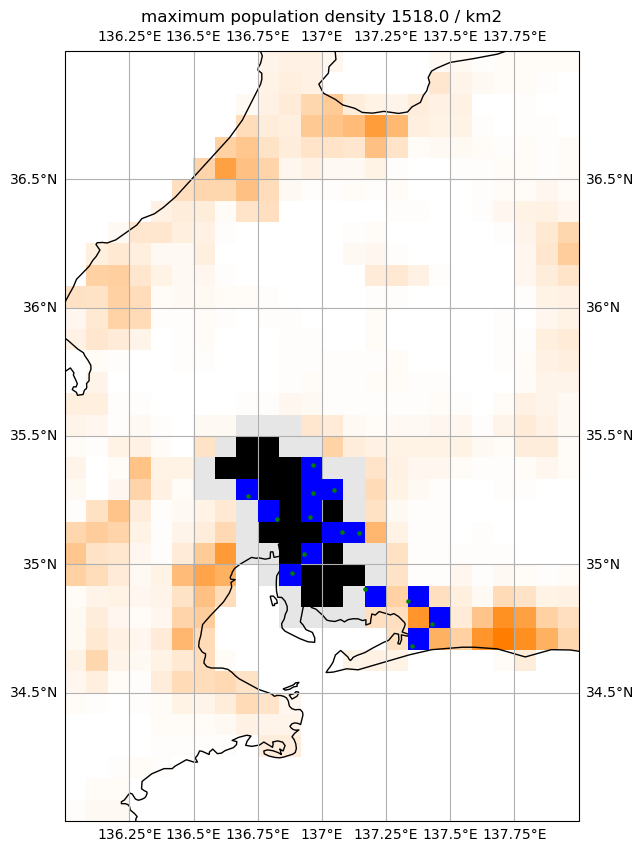

#########################################
explored_pop 5431742.5
true_pop 8740000
coverage 0.6214808352402746
city_mask 26.0
ChukyoM.M.A.(Nagoya)
#########################################


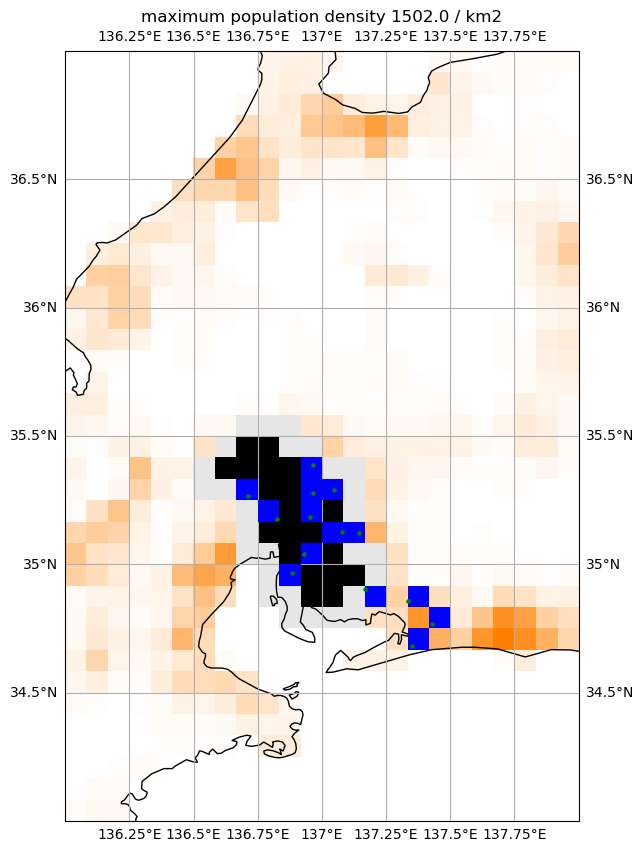

#########################################
explored_pop 5538438.0
true_pop 8740000
coverage 0.6336885583524028
city_mask 27.0
ChukyoM.M.A.(Nagoya)
#########################################


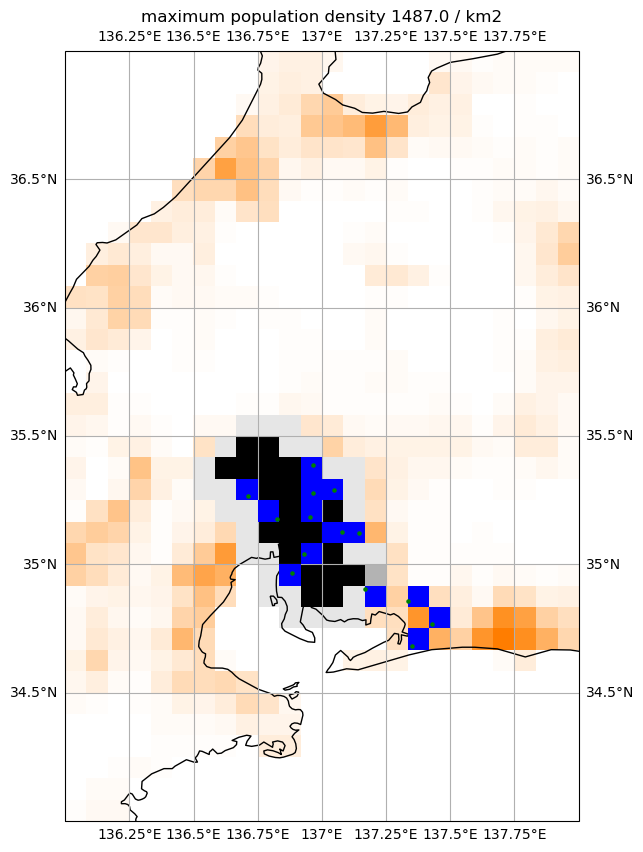

#########################################
explored_pop 5643595.5
true_pop 8740000
coverage 0.6457203089244852
city_mask 28.0
ChukyoM.M.A.(Nagoya)
#########################################


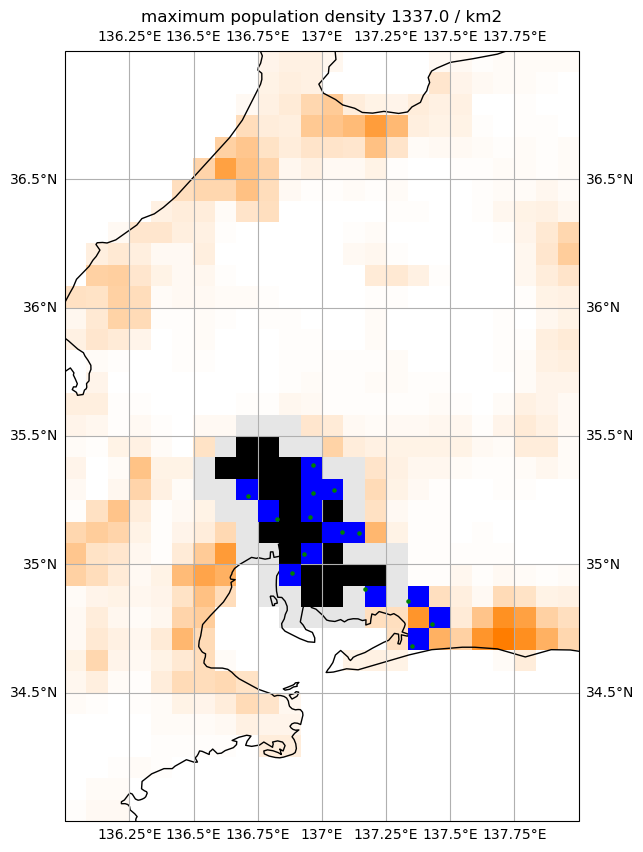

#########################################
explored_pop 5748102.0
true_pop 8740000
coverage 0.6576775743707094
city_mask 29.0
ChukyoM.M.A.(Nagoya)
#########################################


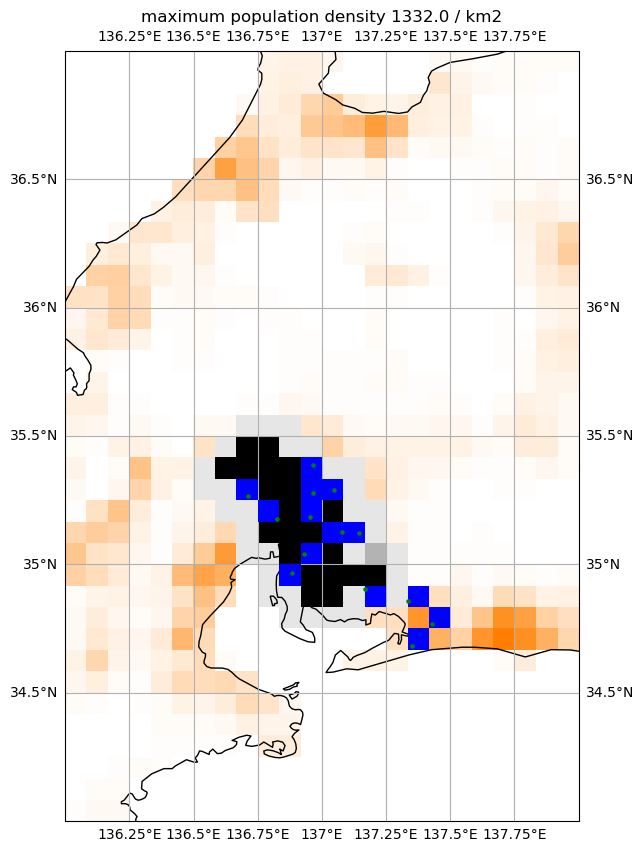

#########################################
explored_pop 5841925.0
true_pop 8740000
coverage 0.668412471395881
city_mask 30.0
ChukyoM.M.A.(Nagoya)
#########################################


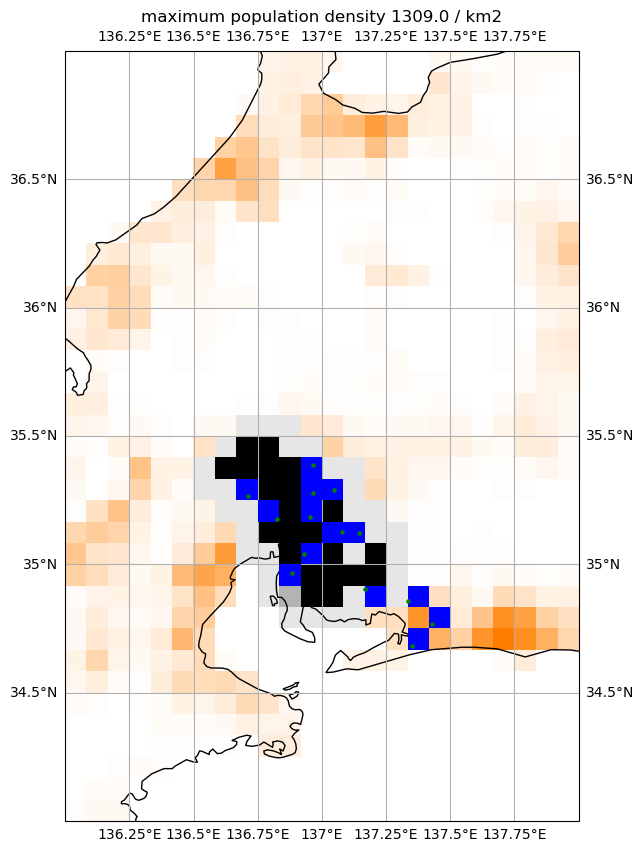

#########################################
explored_pop 5935454.5
true_pop 8740000
coverage 0.6791137871853546
city_mask 31.0
ChukyoM.M.A.(Nagoya)
#########################################


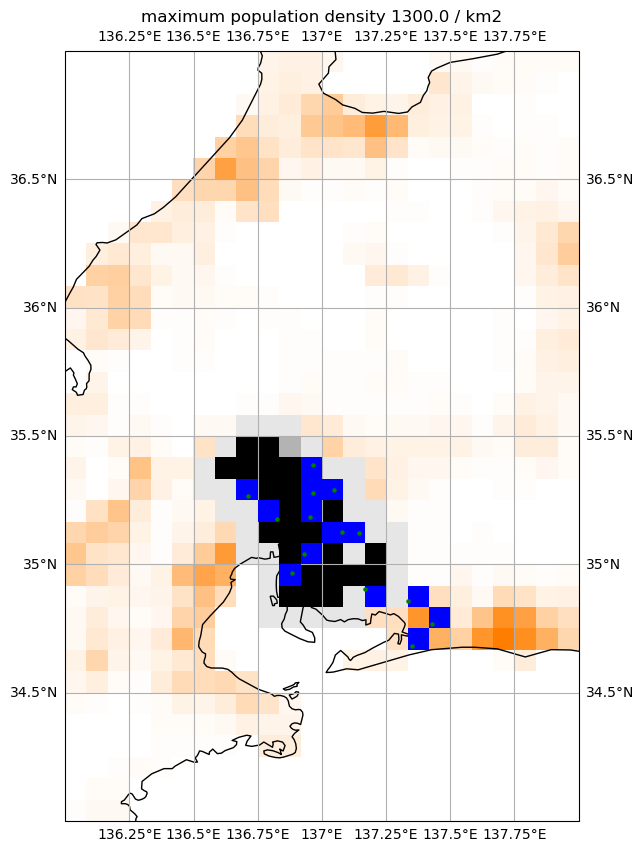

#########################################
explored_pop 6027554.5
true_pop 8740000
coverage 0.6896515446224256
city_mask 32.0
ChukyoM.M.A.(Nagoya)
#########################################


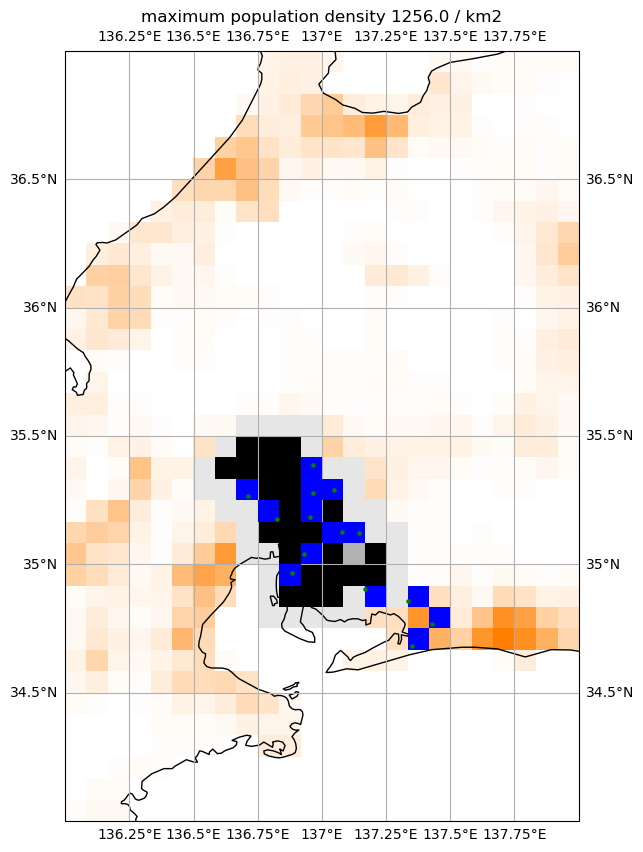

#########################################
explored_pop 6118375.0
true_pop 8740000
coverage 0.7000429061784897
city_mask 33.0
ChukyoM.M.A.(Nagoya)
#########################################


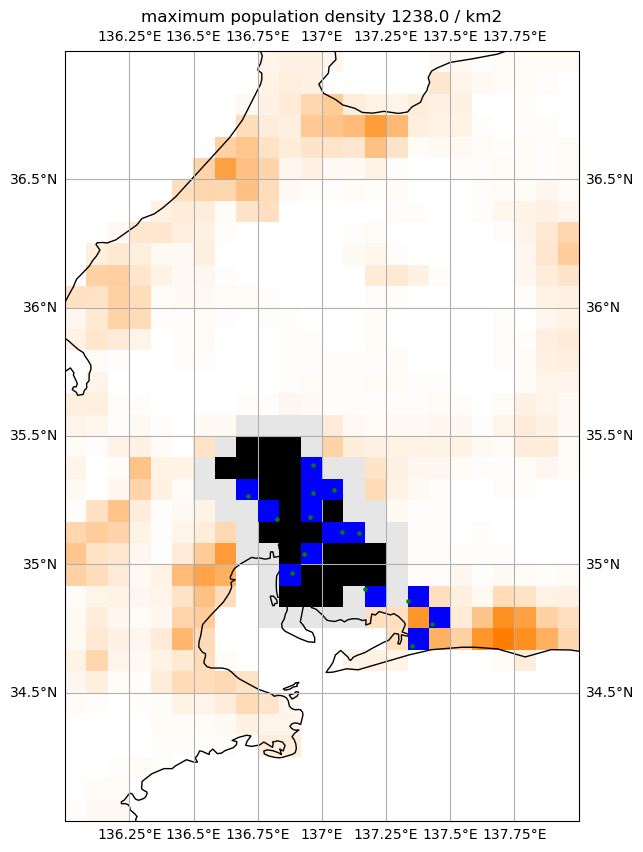

#########################################
explored_pop 6206581.0
true_pop 8740000
coverage 0.7101351258581236
city_mask 34.0
ChukyoM.M.A.(Nagoya)
#########################################


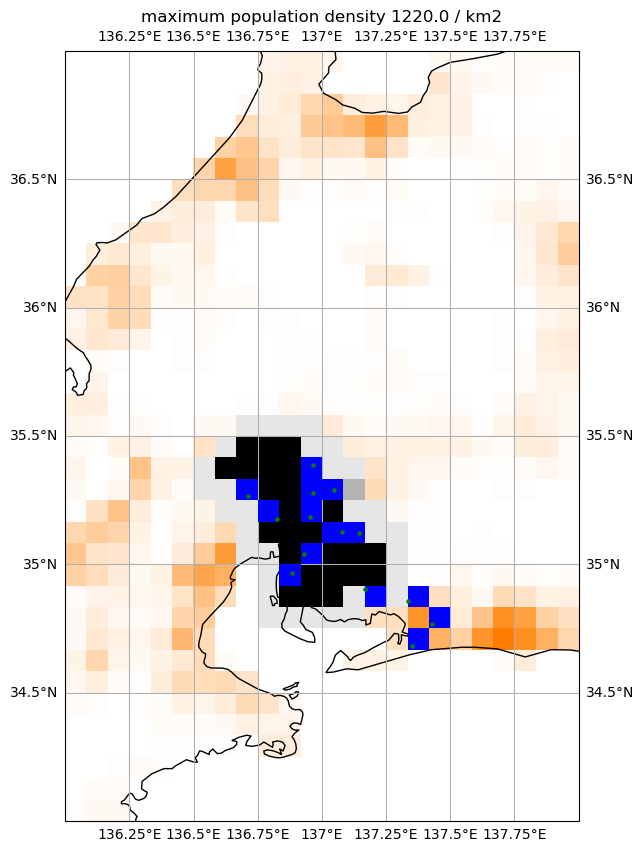

#########################################
explored_pop 6293143.0
true_pop 8740000
coverage 0.7200392448512586
city_mask 35.0
ChukyoM.M.A.(Nagoya)
#########################################


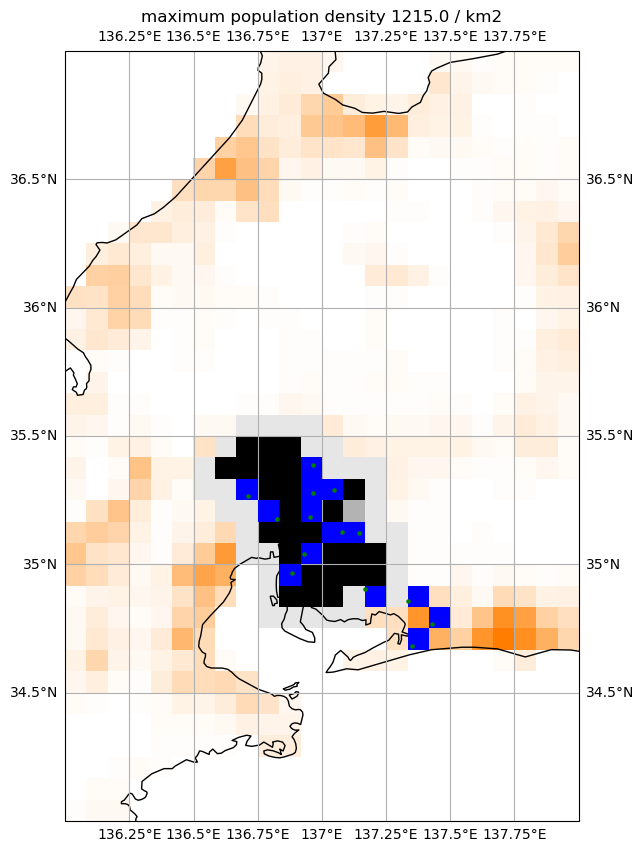

#########################################
explored_pop 6378553.0
true_pop 8740000
coverage 0.7298115560640732
city_mask 36.0
ChukyoM.M.A.(Nagoya)
#########################################


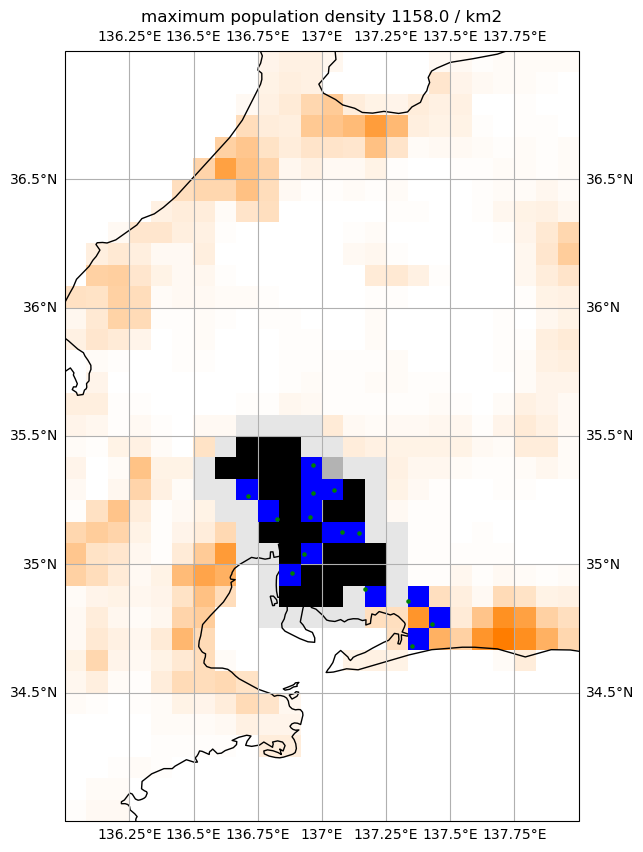

#########################################
explored_pop 6463691.0
true_pop 8740000
coverage 0.7395527459954233
city_mask 37.0
ChukyoM.M.A.(Nagoya)
#########################################


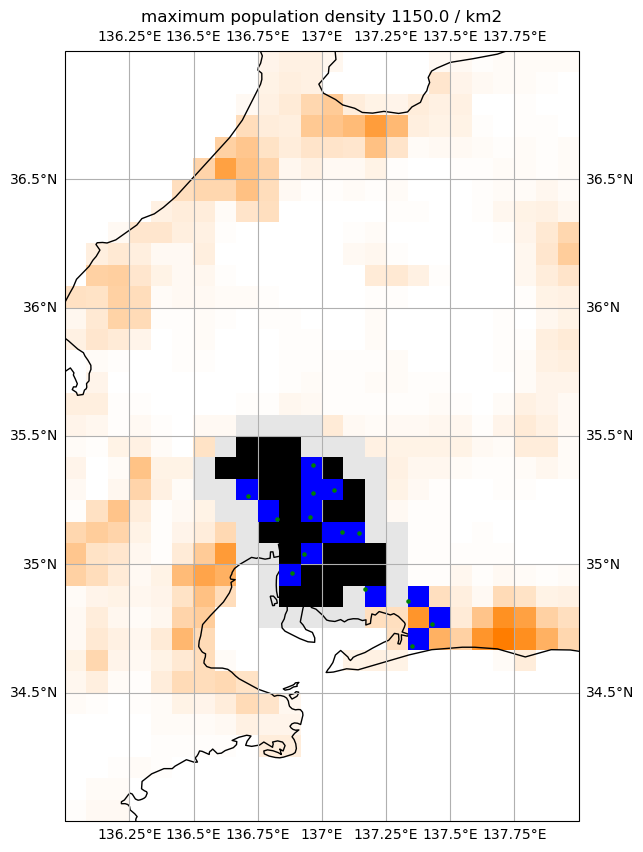

#########################################
explored_pop 6544709.5
true_pop 8740000
coverage 0.7488225972540046
city_mask 38.0
ChukyoM.M.A.(Nagoya)
#########################################


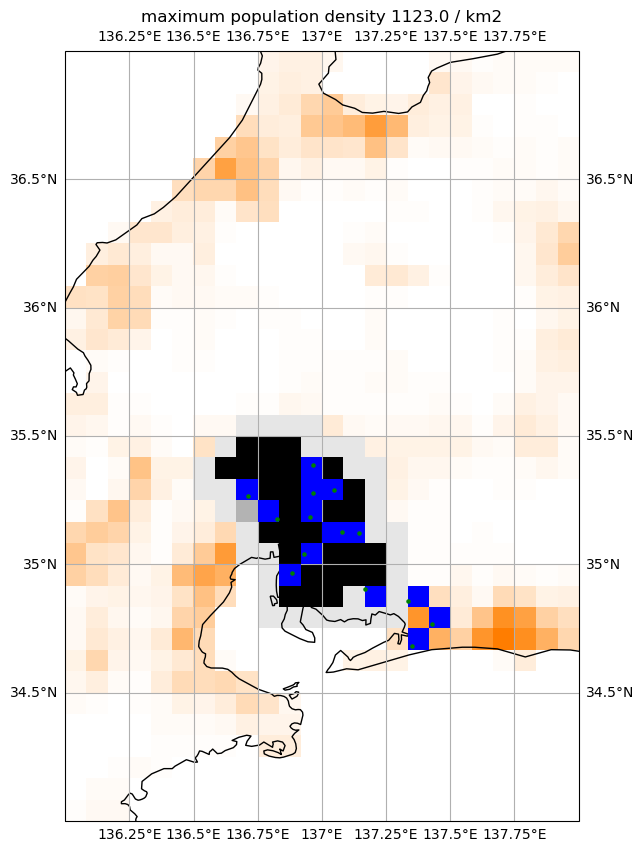

#########################################
explored_pop 6625595.5
true_pop 8740000
coverage 0.7580772883295195
city_mask 39.0
ChukyoM.M.A.(Nagoya)
#########################################


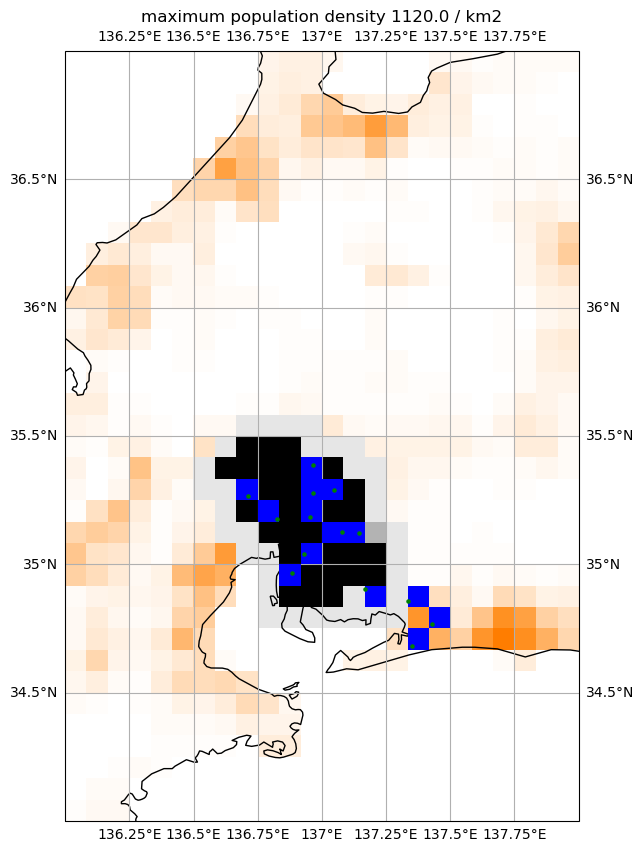

#########################################
explored_pop 6704267.5
true_pop 8740000
coverage 0.7670786613272311
city_mask 40.0
ChukyoM.M.A.(Nagoya)
#########################################


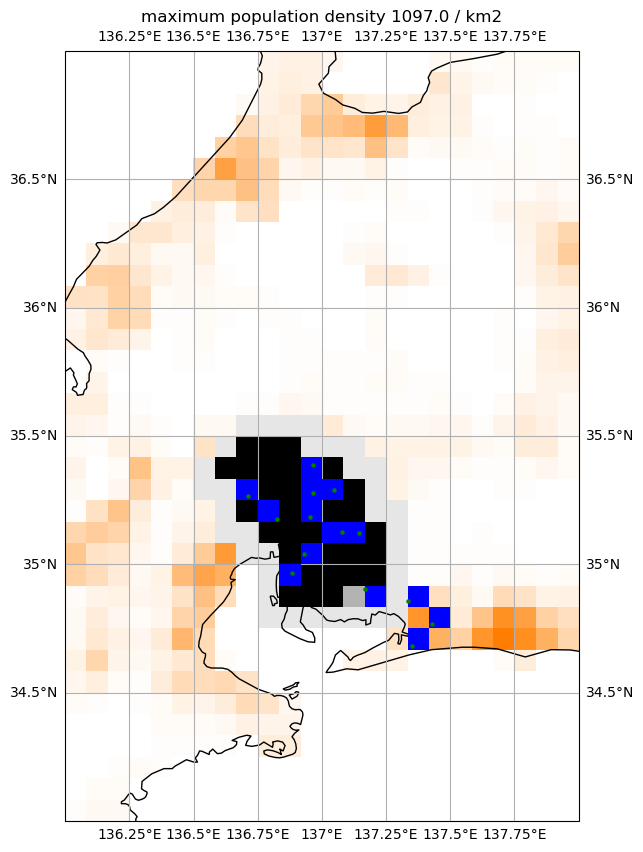

#########################################
explored_pop 6782861.5
true_pop 8740000
coverage 0.776071109839817
city_mask 41.0
ChukyoM.M.A.(Nagoya)
#########################################


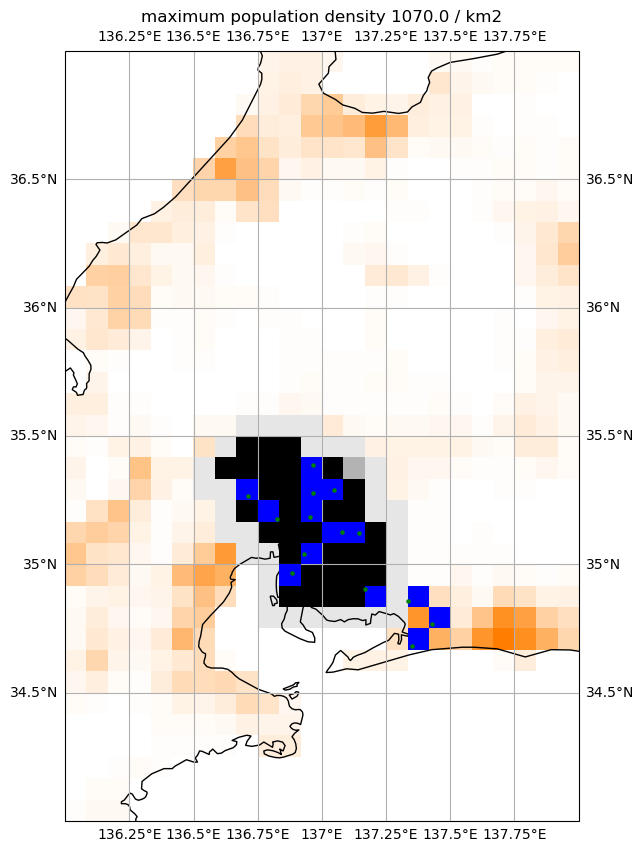

#########################################
explored_pop 6860048.0
true_pop 8740000
coverage 0.7849025171624714
city_mask 42.0
ChukyoM.M.A.(Nagoya)
#########################################


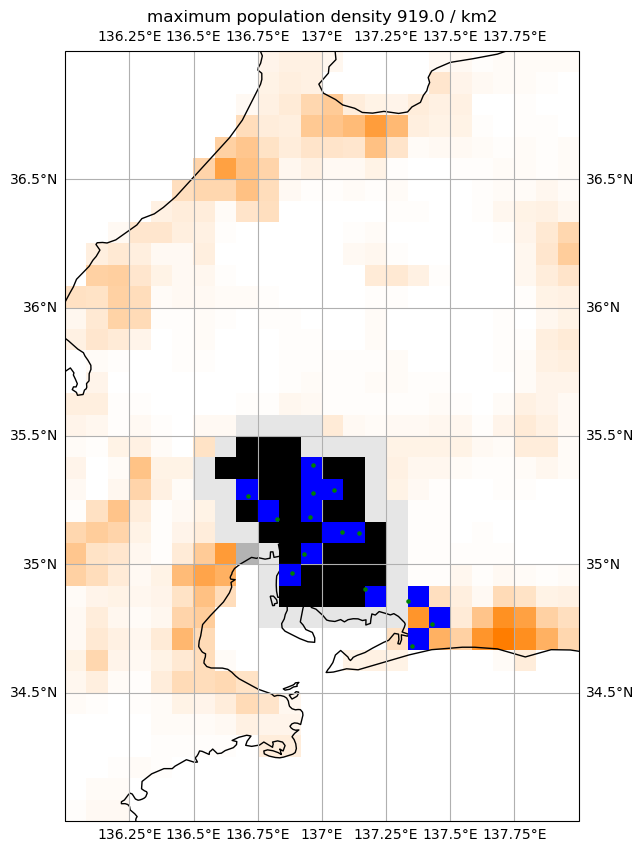

#########################################
explored_pop 6934908.5
true_pop 8740000
coverage 0.7934677917620138
city_mask 43.0
ChukyoM.M.A.(Nagoya)
#########################################


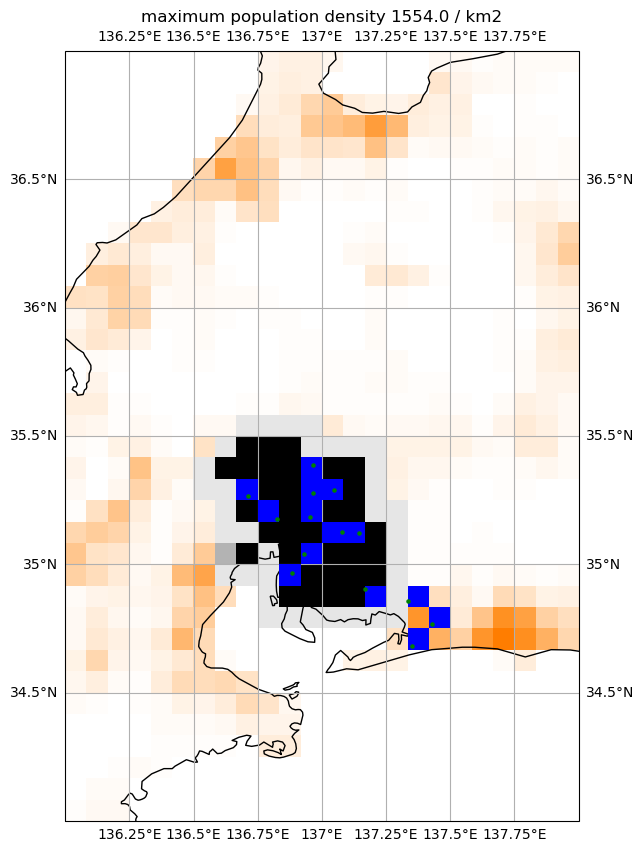

#########################################
explored_pop 6999444.0
true_pop 8740000
coverage 0.8008517162471396
city_mask 44.0
ChukyoM.M.A.(Nagoya)
#########################################


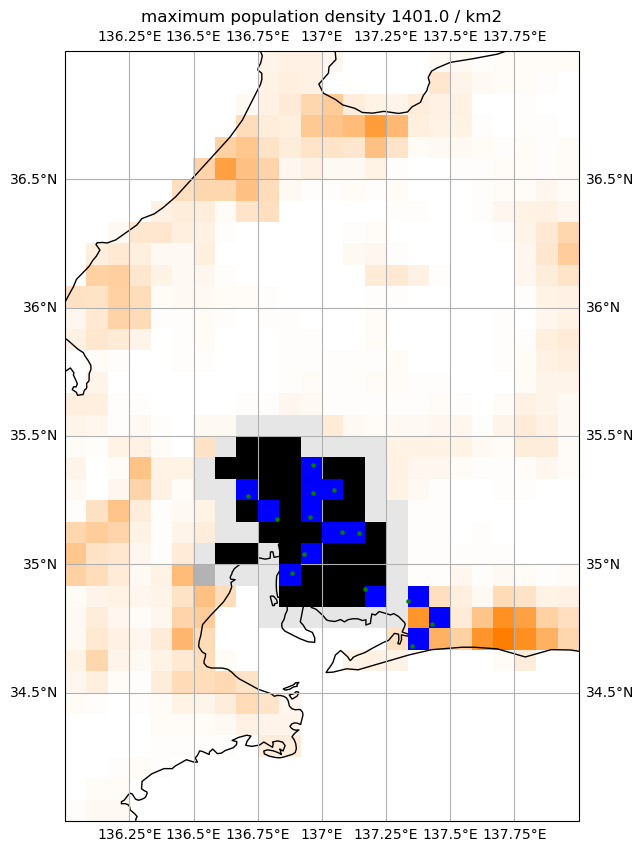

#########################################
explored_pop 7108595.5
true_pop 8740000
coverage 0.8133404462242563
city_mask 45.0
ChukyoM.M.A.(Nagoya)
#########################################


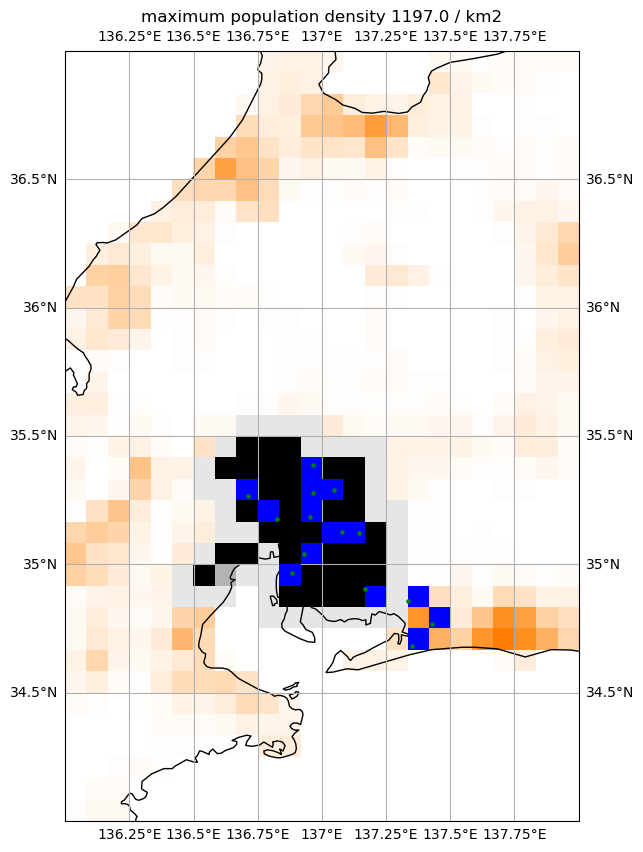

#########################################
explored_pop 7207101.5
true_pop 8740000
coverage 0.8246111556064073
city_mask 46.0
ChukyoM.M.A.(Nagoya)
#########################################


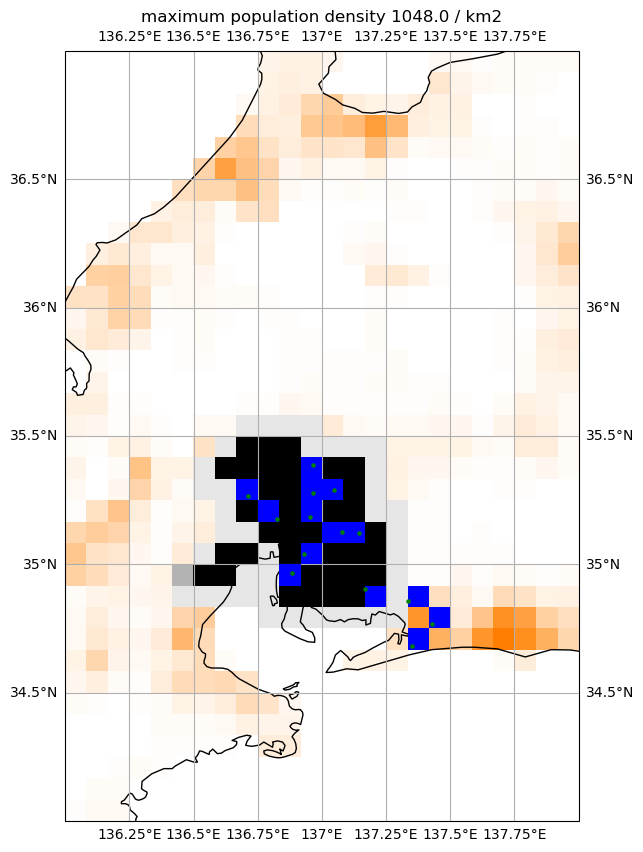

#########################################
explored_pop 7291235.5
true_pop 8740000
coverage 0.834237471395881
city_mask 47.0
ChukyoM.M.A.(Nagoya)
#########################################


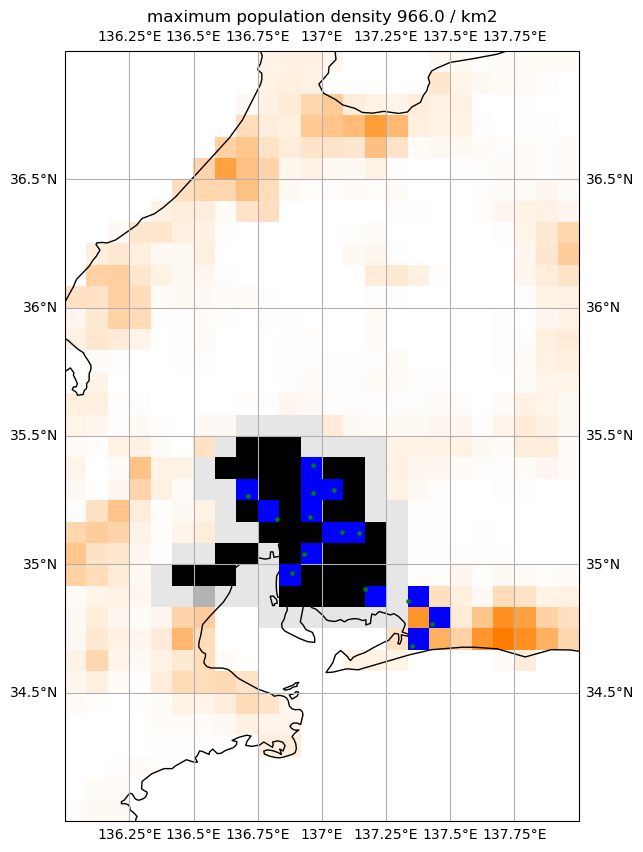

#########################################
explored_pop 7364868.0
true_pop 8740000
coverage 0.8426622425629291
city_mask 48.0
ChukyoM.M.A.(Nagoya)
#########################################


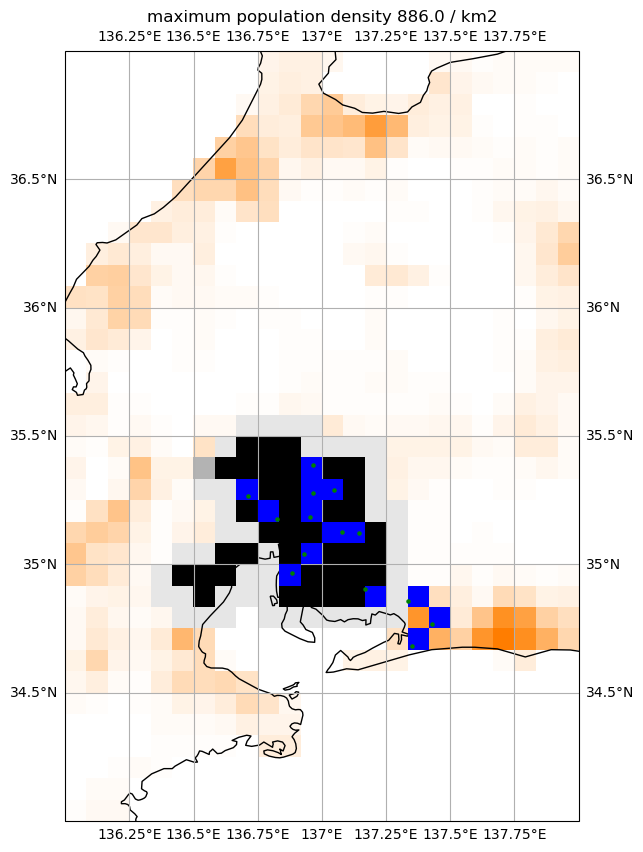

#########################################
explored_pop 7432811.0
true_pop 8740000
coverage 0.8504360411899313
city_mask 49.0
ChukyoM.M.A.(Nagoya)
#########################################


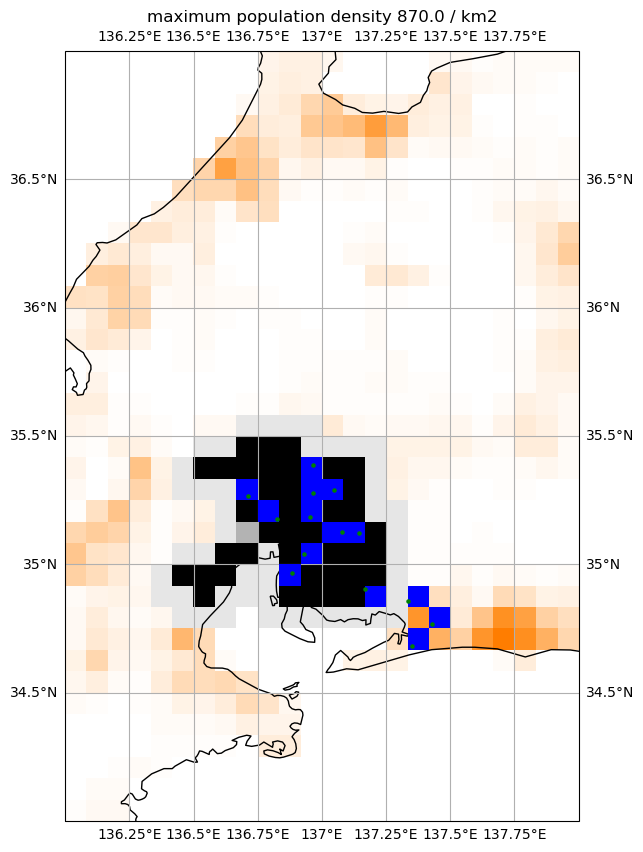

#########################################
explored_pop 7494756.0
true_pop 8740000
coverage 0.8575235697940503
city_mask 50.0
ChukyoM.M.A.(Nagoya)
#########################################


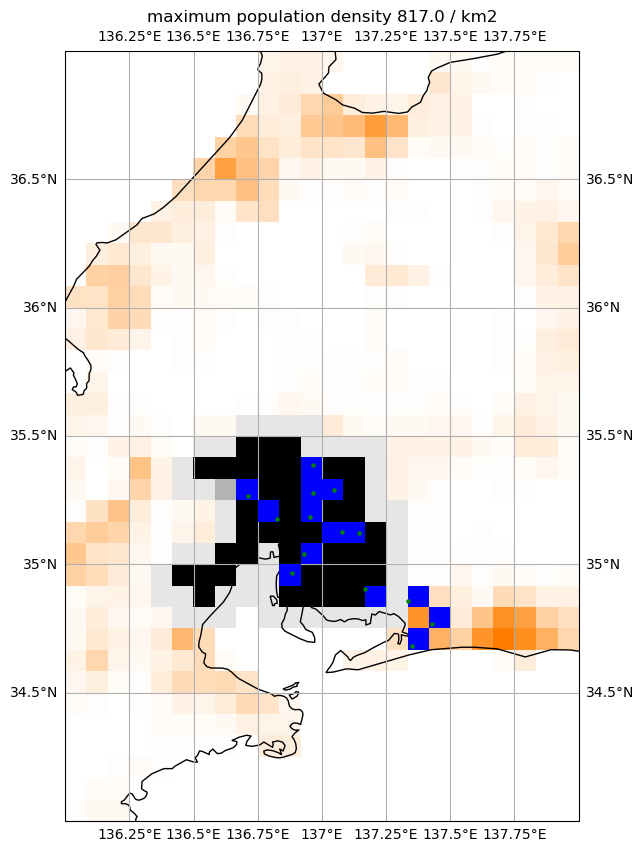

#########################################
explored_pop 7555803.0
true_pop 8740000
coverage 0.864508352402746
city_mask 51.0
ChukyoM.M.A.(Nagoya)
#########################################


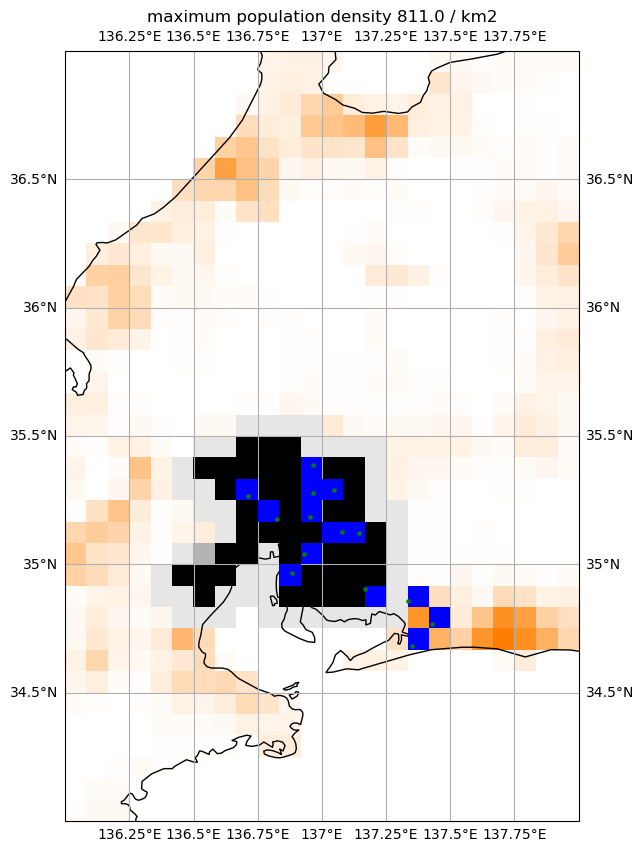

#########################################
explored_pop 7612989.0
true_pop 8740000
coverage 0.8710513729977116
city_mask 52.0
ChukyoM.M.A.(Nagoya)
#########################################


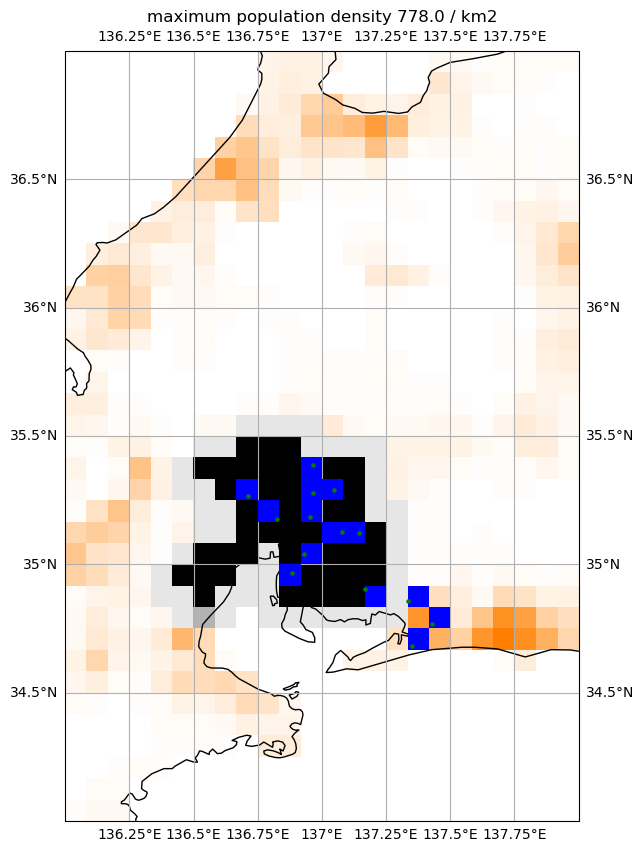

#########################################
explored_pop 7669936.0
true_pop 8740000
coverage 0.8775670480549199
city_mask 53.0
ChukyoM.M.A.(Nagoya)
#########################################


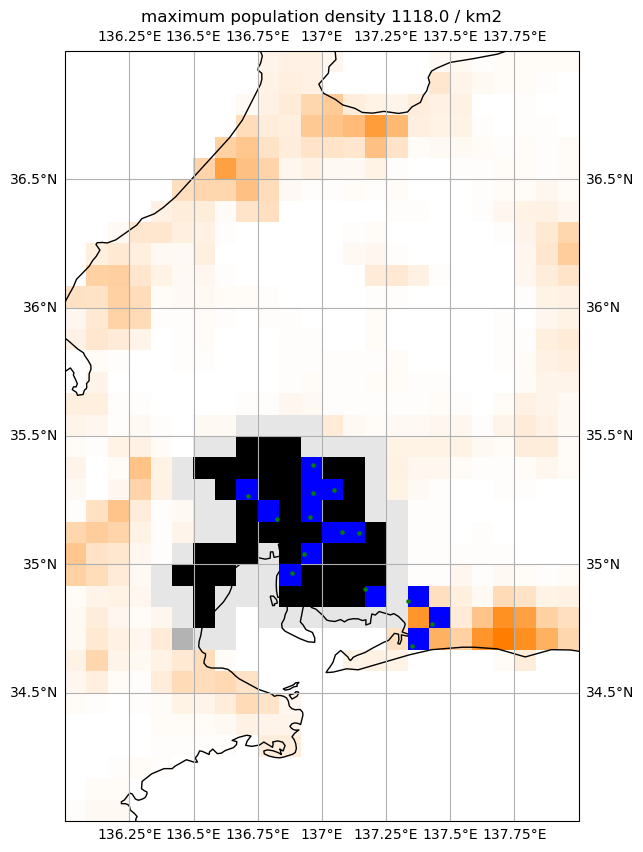

#########################################
explored_pop 7724704.0
true_pop 8740000
coverage 0.883833409610984
city_mask 54.0
ChukyoM.M.A.(Nagoya)
#########################################


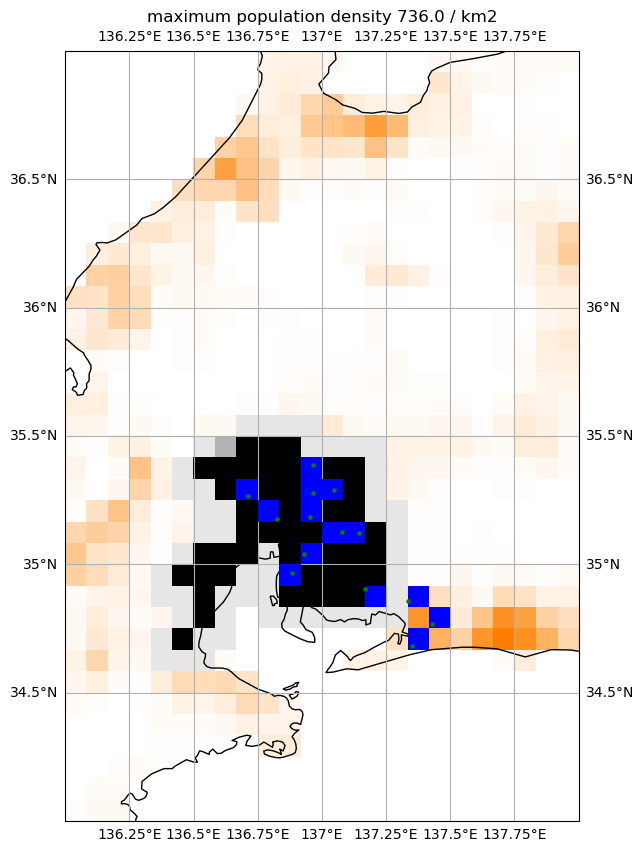

#########################################
explored_pop 7803529.5
true_pop 8740000
coverage 0.8928523455377574
city_mask 55.0
ChukyoM.M.A.(Nagoya)
#########################################


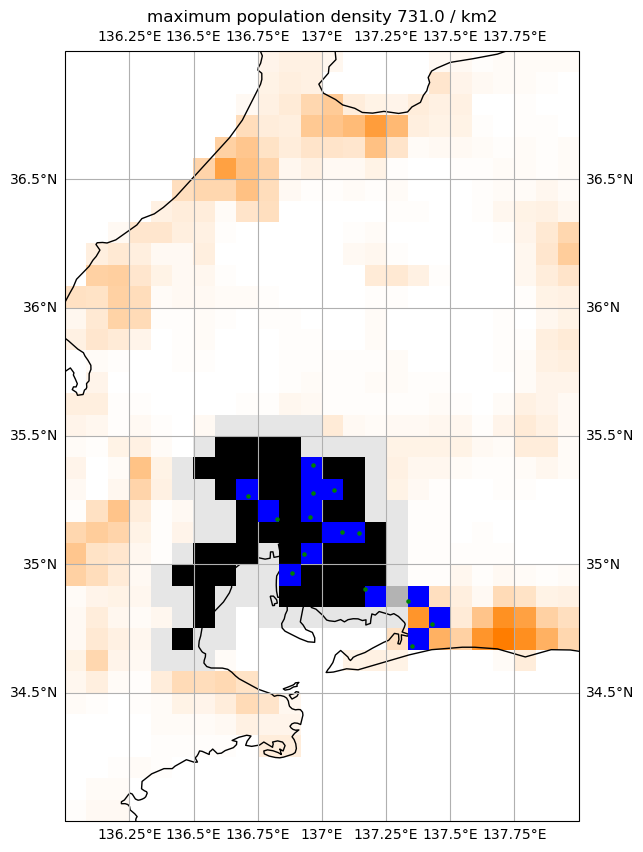

#########################################
explored_pop 7854955.5
true_pop 8740000
coverage 0.8987363272311213
city_mask 56.0
ChukyoM.M.A.(Nagoya)
#########################################


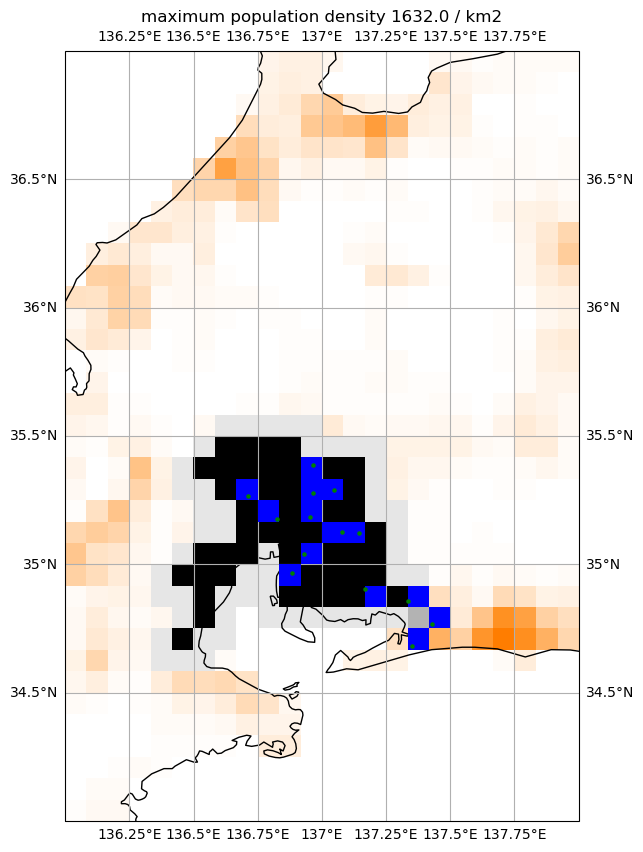

#########################################
explored_pop 7906420.0
true_pop 8740000
coverage 0.9046247139588101
city_mask 57.0
ChukyoM.M.A.(Nagoya)
#########################################


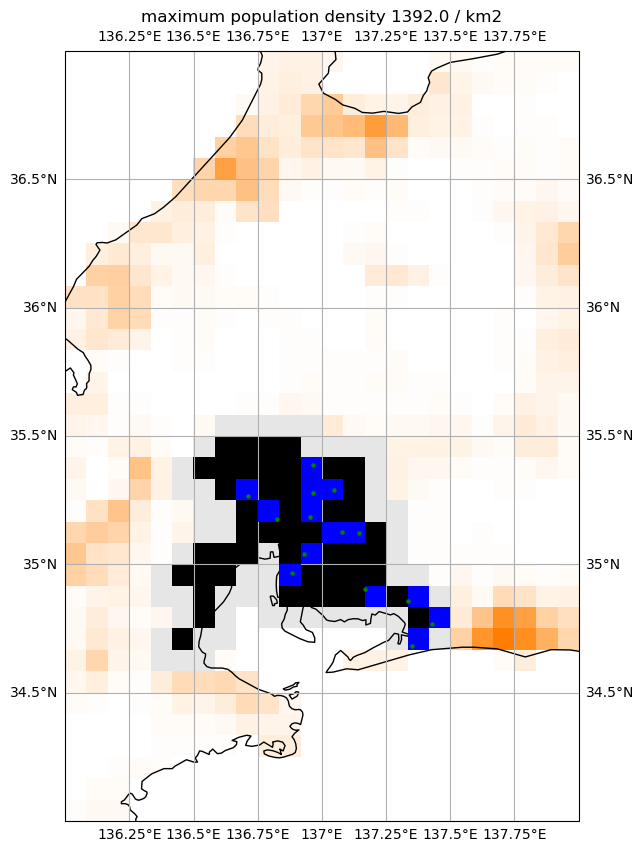

#########################################
explored_pop 8021331.0
true_pop 8740000
coverage 0.9177724256292906
city_mask 58.0
ChukyoM.M.A.(Nagoya)
#########################################


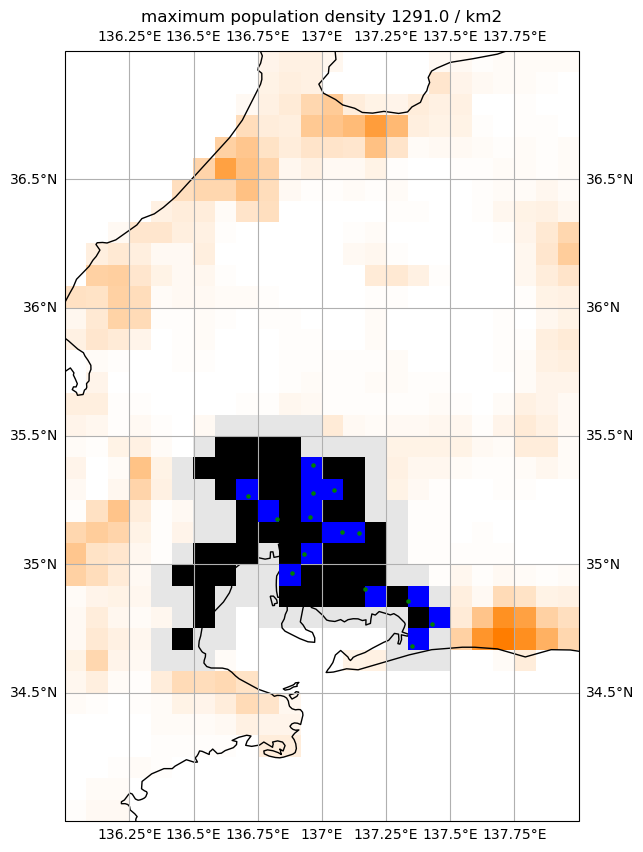

#########################################
explored_pop 8119461.5
true_pop 8740000
coverage 0.9290001716247139
city_mask 59.0
ChukyoM.M.A.(Nagoya)
#########################################


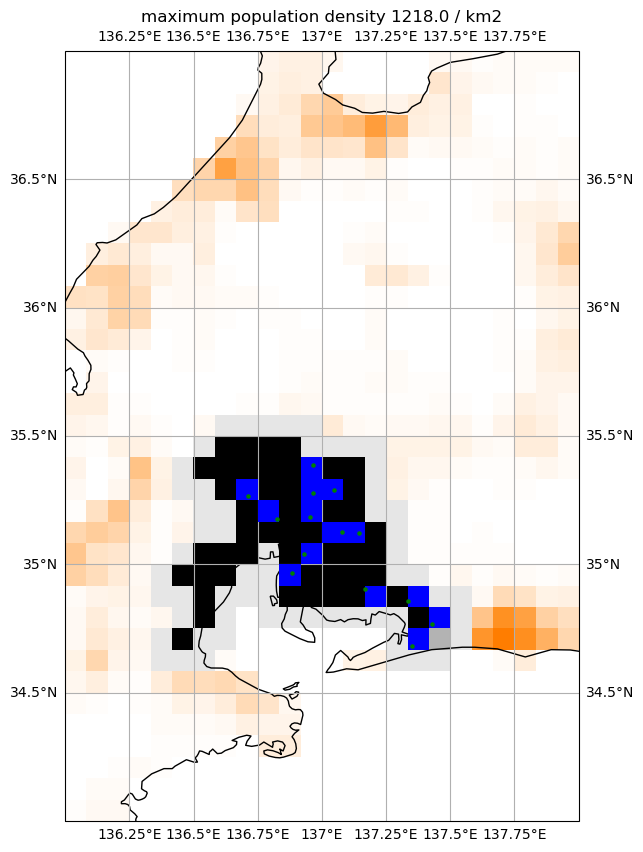

#########################################
explored_pop 8210367.0
true_pop 8740000
coverage 0.9394012585812357
city_mask 60.0
ChukyoM.M.A.(Nagoya)
#########################################


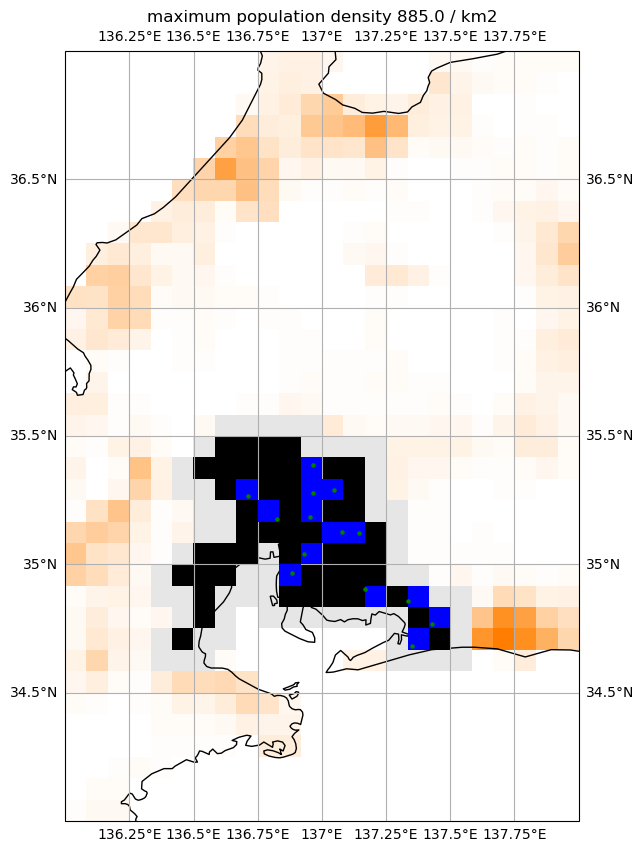

#########################################
explored_pop 8296208.0
true_pop 8740000
coverage 0.9492228832951946
city_mask 61.0
ChukyoM.M.A.(Nagoya)
#########################################


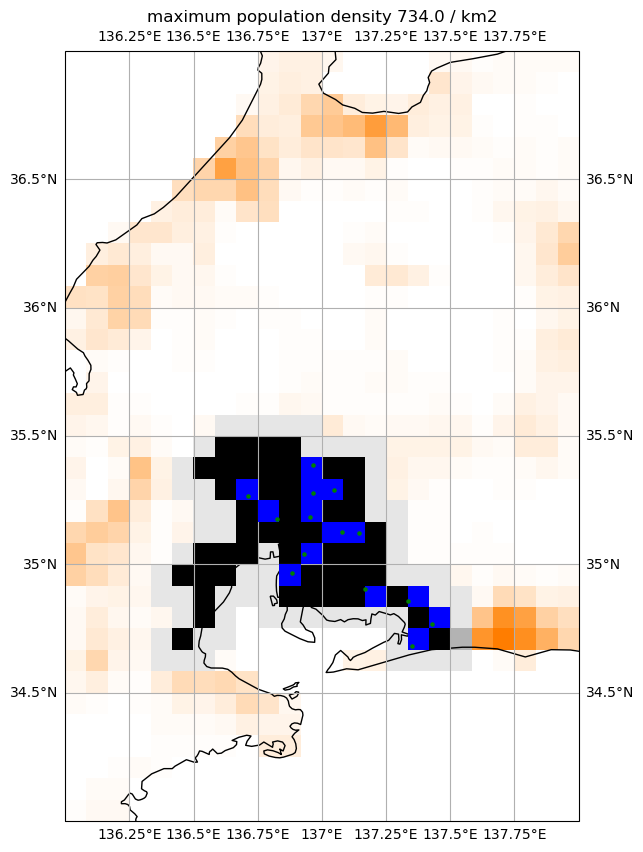

#########################################
explored_pop 8358501.5
true_pop 8740000
coverage 0.9563502860411899
city_mask 62.0
ChukyoM.M.A.(Nagoya)
#########################################


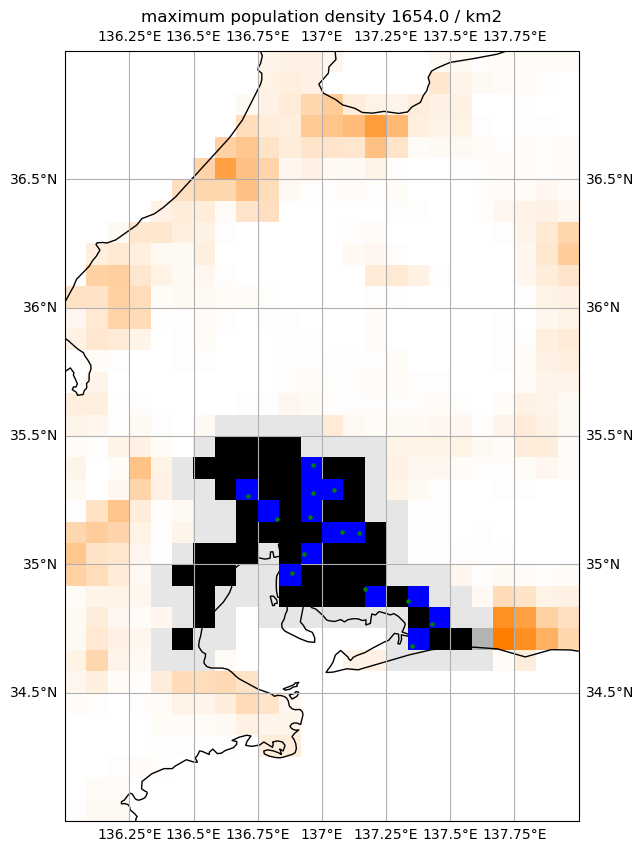

#########################################
explored_pop 8410222.0
true_pop 8740000
coverage 0.9622679633867277
city_mask 63.0
ChukyoM.M.A.(Nagoya)
#########################################


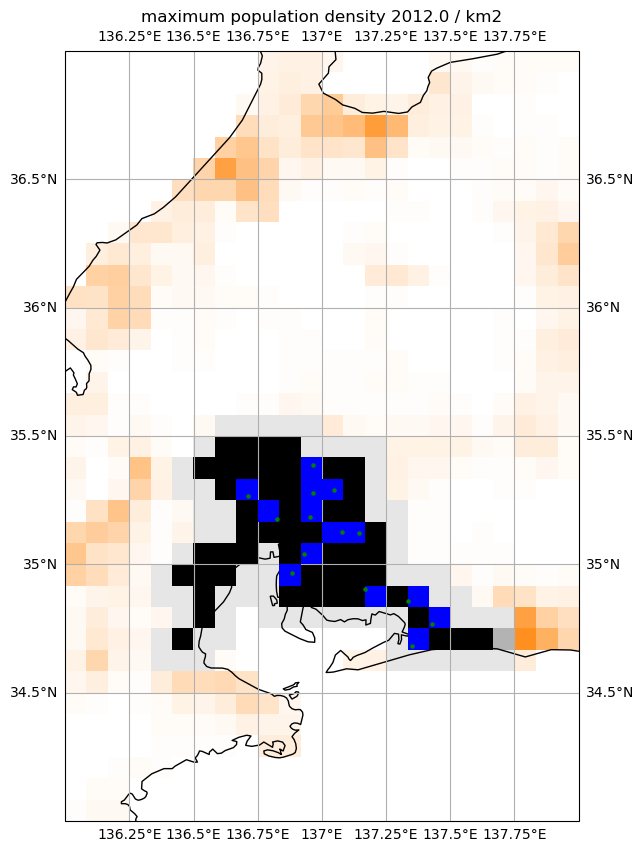

#########################################
explored_pop 8526819.0
true_pop 8740000
coverage 0.9756085812356979
city_mask 64.0
ChukyoM.M.A.(Nagoya)
#########################################


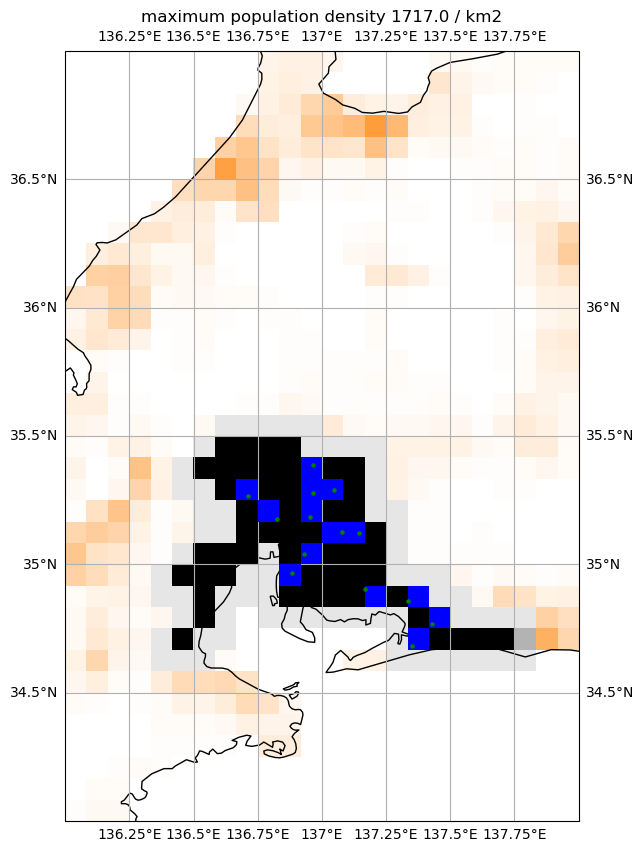

#########################################
explored_pop 8668662.0
true_pop 8740000
coverage 0.9918377574370709
city_mask 65.0
ChukyoM.M.A.(Nagoya)
#########################################


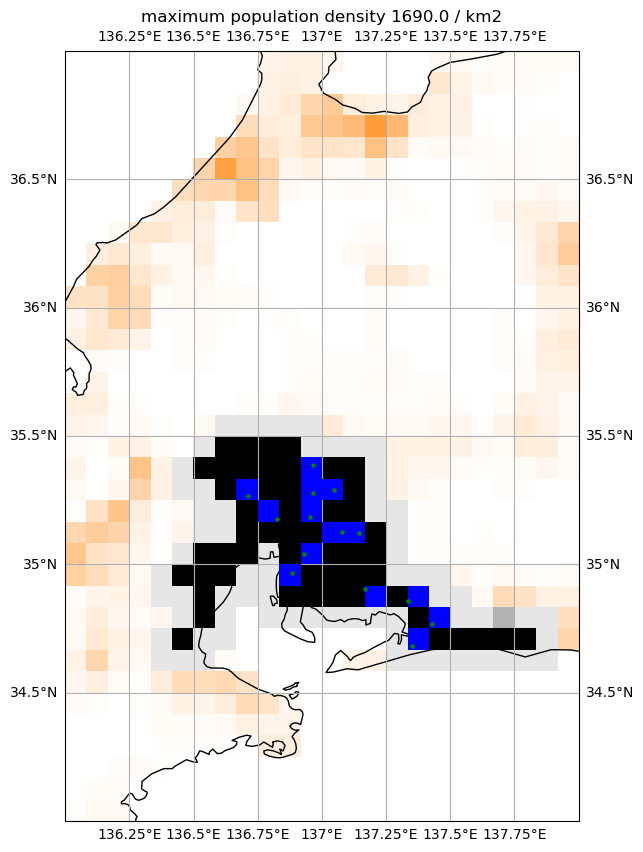

#########################################
explored_pop 8789727.0
true_pop 8740000
coverage 1.0056895881006864
city_mask 66.0
ChukyoM.M.A.(Nagoya)
#########################################


In [485]:
# execute
a, b, upperindex, lowerindex, leftindex, rightindex, rgnshape, img_extent, city_num = geography()
explore_citymask(city_num)
#josui 139.8694531, 35.83236599
#converted 3838, 651
#idial     3838, 649